# Objective

Determine the good measurement for flow cell "dirtiness" (i.e., how badly the background is contaminated by those small bright specks that build up).

# Contents

This notebook shows each image and six different possible metrics for the dirtiness of that image. The six metrics shown here are the following:
- `image_name`: summing the image without filtering
- `sum_filtered1`: summing the image with a bandpass filter to enhance the speckles
- `sum_filtered2`: summing the image with two bandpass filters to remove the "ghosts"
- `sum_filtered2`: summing the binarized image without filtering
- `sum_filtered2`: summing the binarized image with a bandpass filter to enhance the speckles
- `sum_bin_filtered2`: summing the binarized image with two bandpass filters to remove the "ghosts"

At the bottom of the notebook is a plot for each metric with the image name on the vertical axis ticks.

# Results

There’s definite a clearer pattern of dirtiness is definitely increasing from lane 1 to lane 7 as expected in the last two plots, which are the ones for (1) summing the hot areas of an image that was binarized after application of a bandpass filter and (2) summing the hot areas of an image that was binarized after application of the first bandpass filter and also another one to remove the "ghosts.” So those two metrics are possibilities for measuring the dirtiness of the flow cells.

In [13]:
from skimage.io import imread
from skimage.filters import difference_of_gaussians, threshold_otsu
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

In [7]:
def crop_center(img,cropx,cropy):
    y,x = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)
    return img[starty:starty+cropy,startx:startx+cropx]

In [8]:
cropx, cropy = 1448, 1448
sig_min = 1
sig_max1 = 12
sig_max2 = 3
data_dir = '2022-03-25 GB20106 flow cell background sample images'

------------------
background-20220107-111707-1.tif


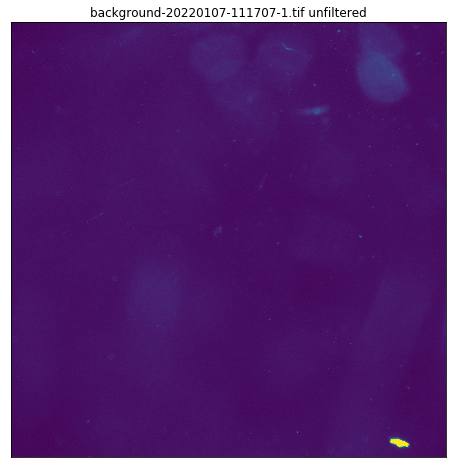

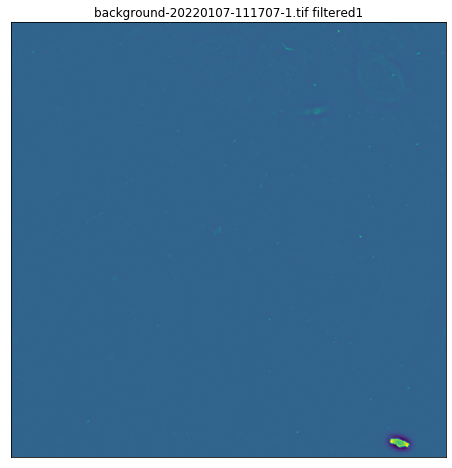

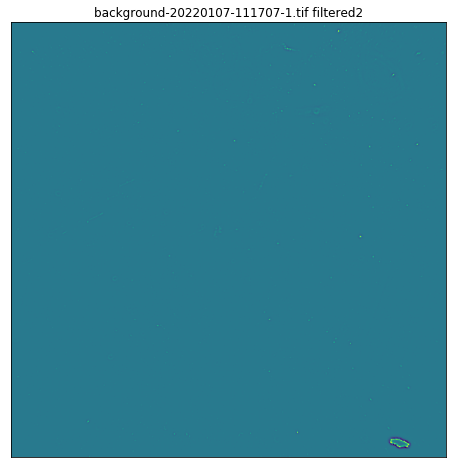

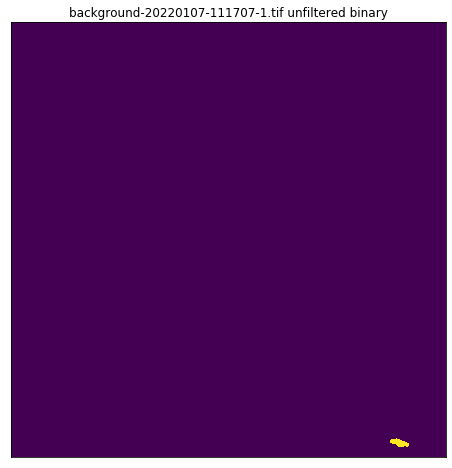

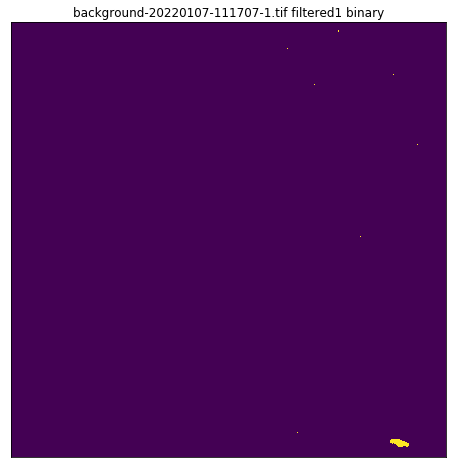

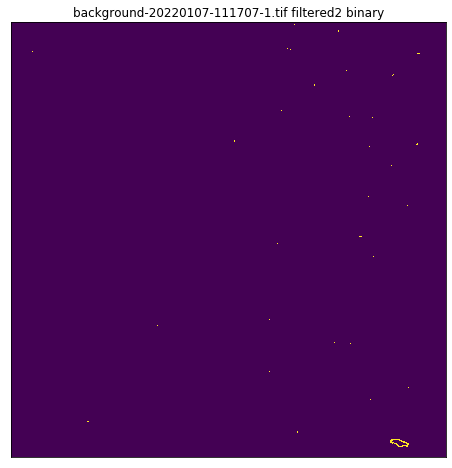

{'sum_unfiltered': 50435621888, 'sum_filtered1': -11.312241048450433, 'sum_filtered2': -0.3610444611889344, 'sum_bin_unfiltered': 1241, 'sum_bin_filtered1': 1206, 'sum_bin_filtered2': 1196}
------------------
background-20220107-111707-7.tif


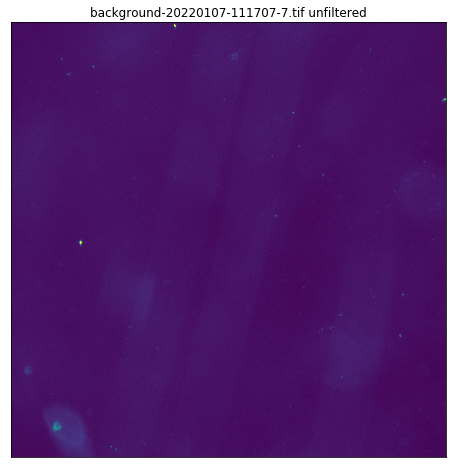

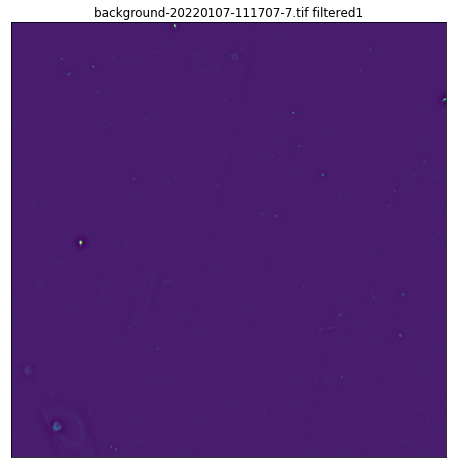

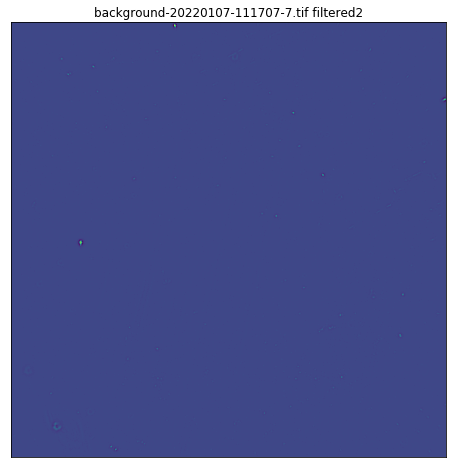

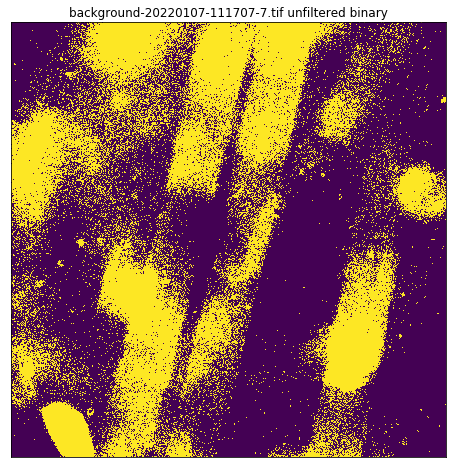

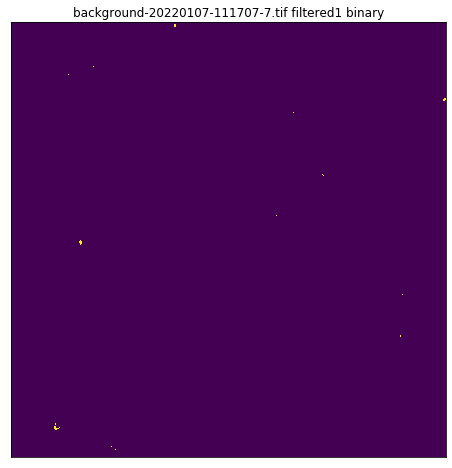

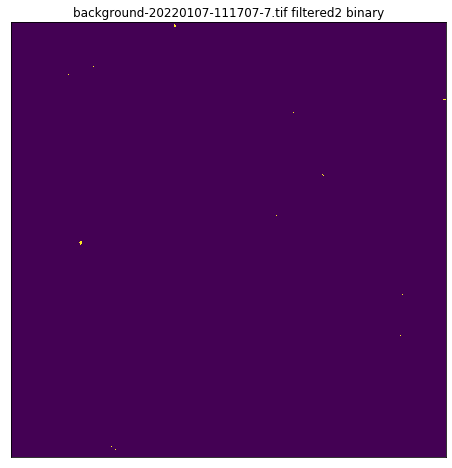

{'sum_unfiltered': 50264438656, 'sum_filtered1': 6.130393937926623, 'sum_filtered2': 0.281362005820597, 'sum_bin_unfiltered': 765298, 'sum_bin_filtered1': 527, 'sum_bin_filtered2': 279}
------------------
background-20220112-105942-1.tif


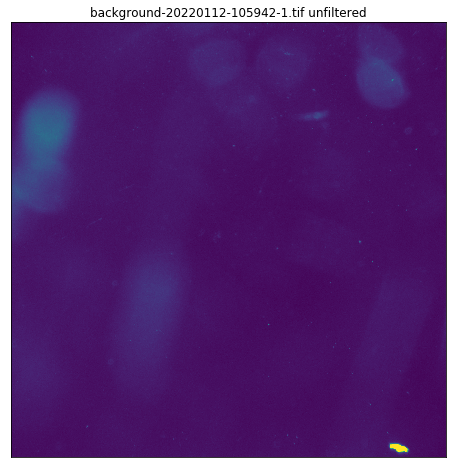

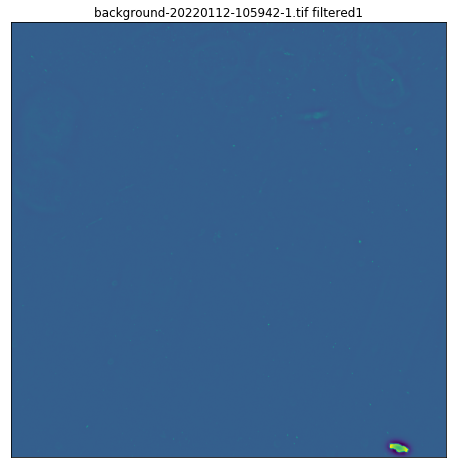

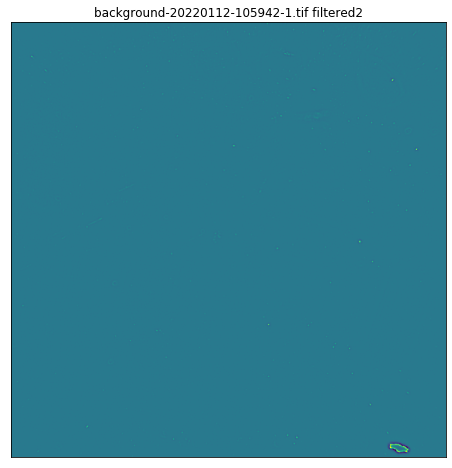

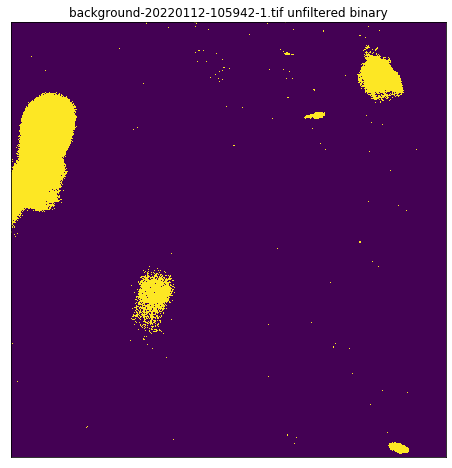

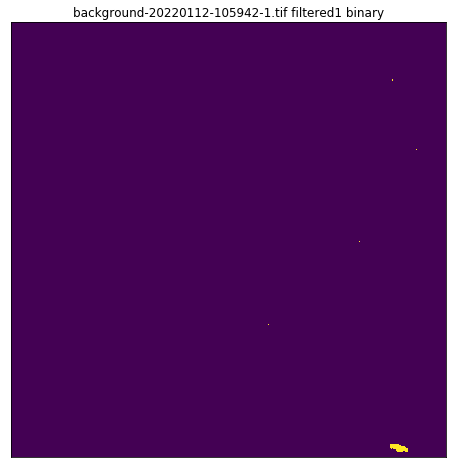

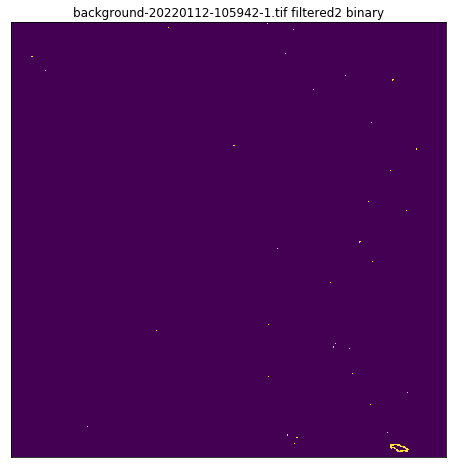

{'sum_unfiltered': 53868010112, 'sum_filtered1': 12.817985340076824, 'sum_filtered2': -1.4783046079998576, 'sum_bin_unfiltered': 98500, 'sum_bin_filtered1': 1148, 'sum_bin_filtered2': 1107}
------------------
background-20220112-105942-7.tif


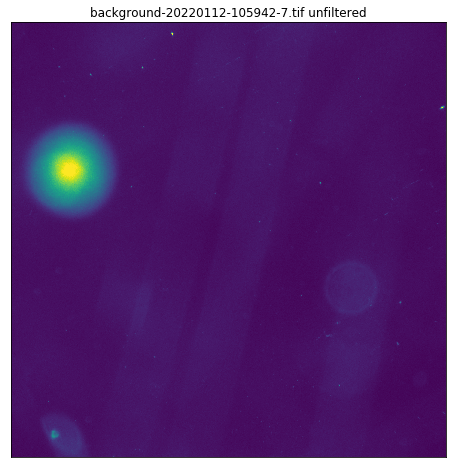

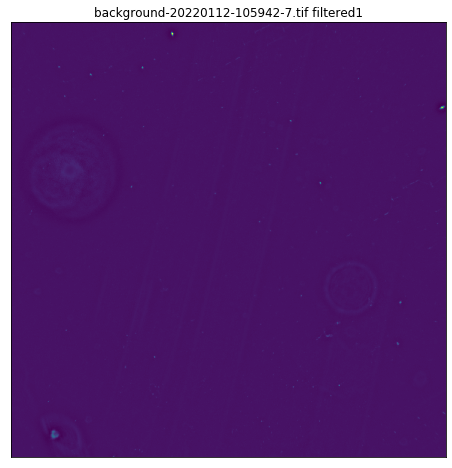

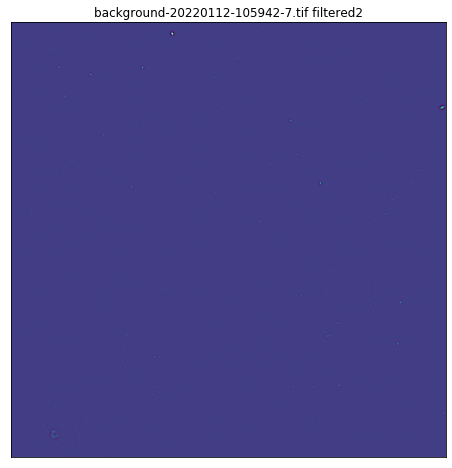

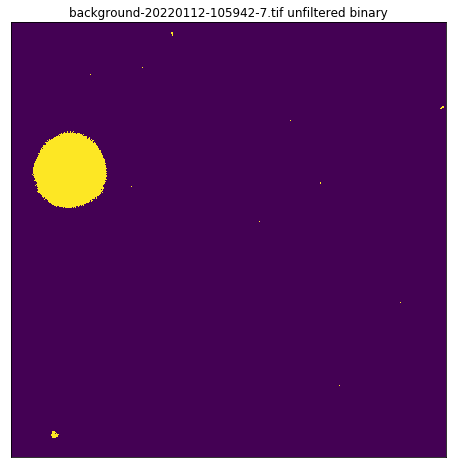

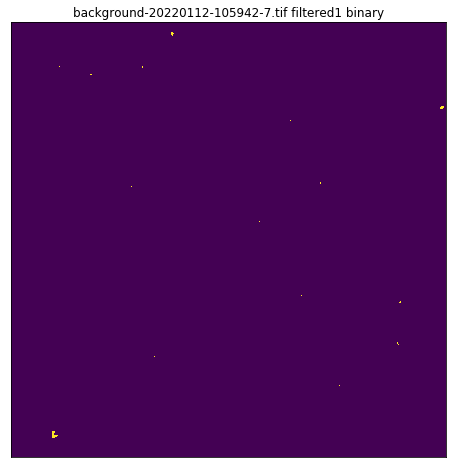

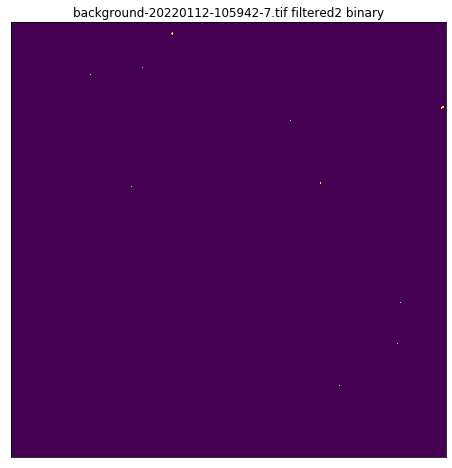

{'sum_unfiltered': 55365896704, 'sum_filtered1': -1.8219878458151726, 'sum_filtered2': -0.3550209625810217, 'sum_bin_unfiltered': 48415, 'sum_bin_filtered1': 698, 'sum_bin_filtered2': 235}
------------------
background-20220112-132037-1.tif


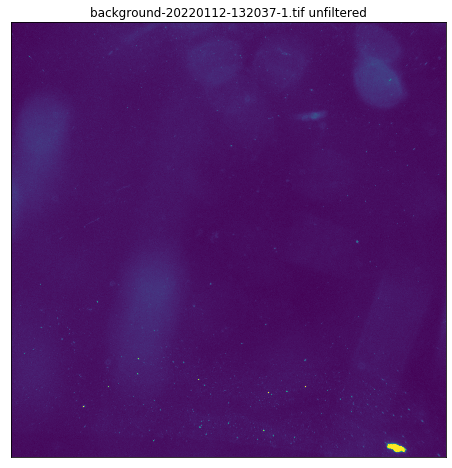

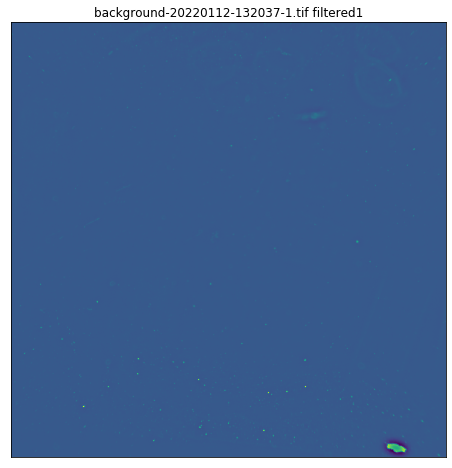

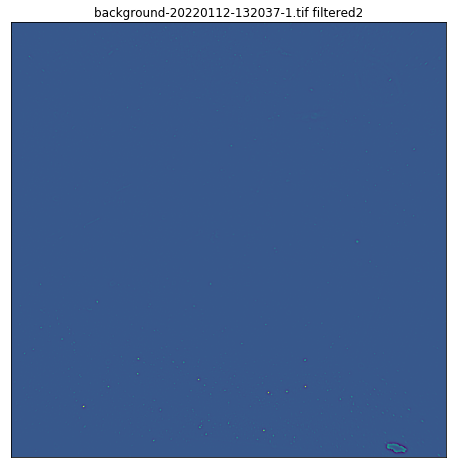

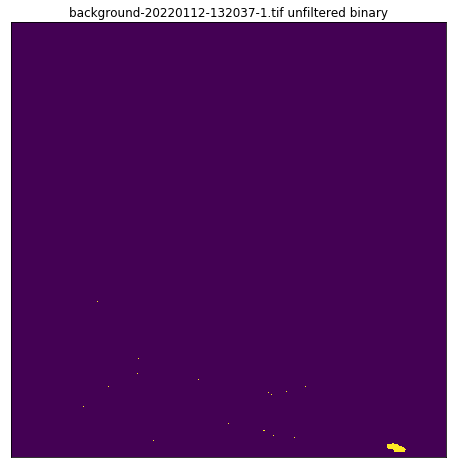

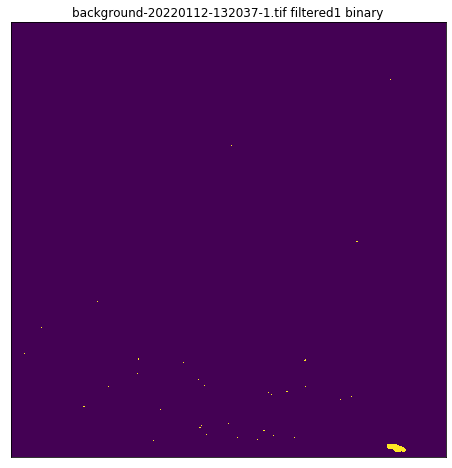

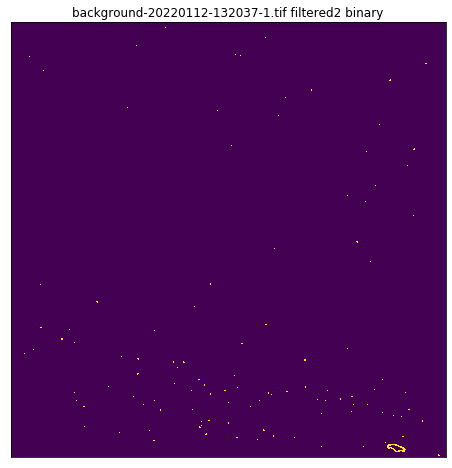

{'sum_unfiltered': 54399515392, 'sum_filtered1': -0.978674622103604, 'sum_filtered2': -1.3171512556298017, 'sum_bin_unfiltered': 1391, 'sum_bin_filtered1': 1569, 'sum_bin_filtered2': 2448}
------------------
background-20220112-132037-7.tif


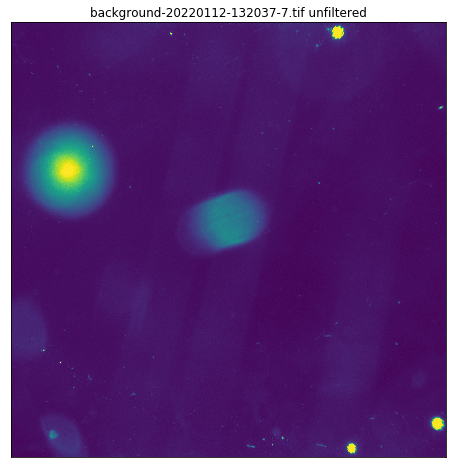

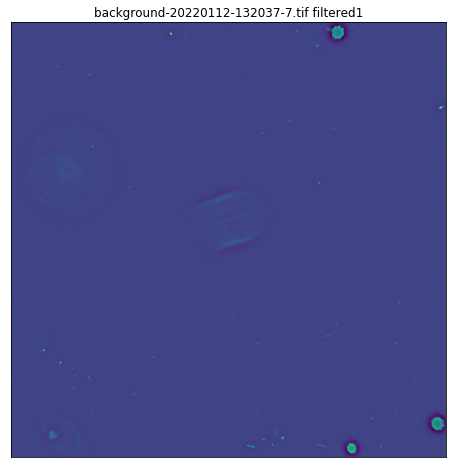

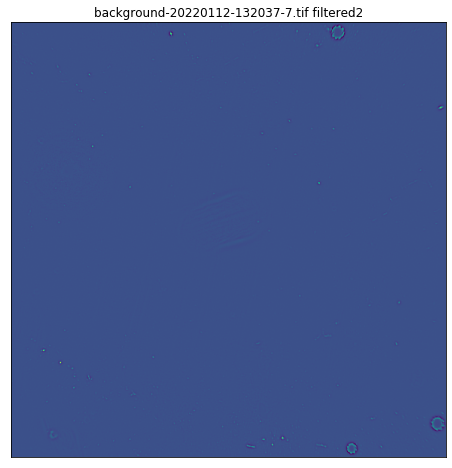

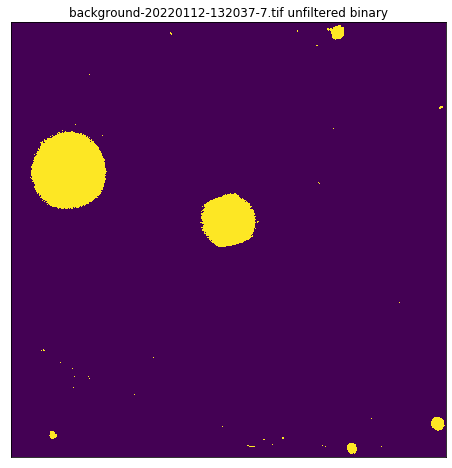

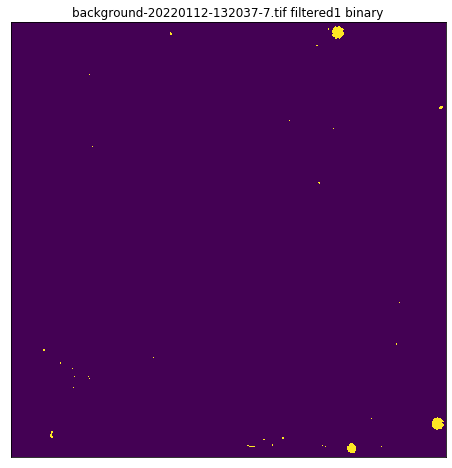

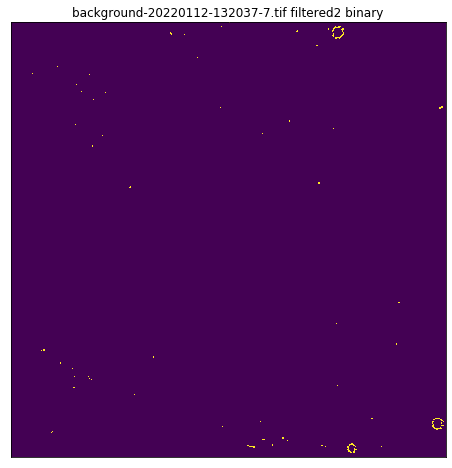

{'sum_unfiltered': 58533062400, 'sum_filtered1': 78.82488091307843, 'sum_filtered2': -2.4448364667269176, 'sum_bin_unfiltered': 80862, 'sum_bin_filtered1': 4172, 'sum_bin_filtered2': 2409}
------------------
background-20220113-143848-1.tif


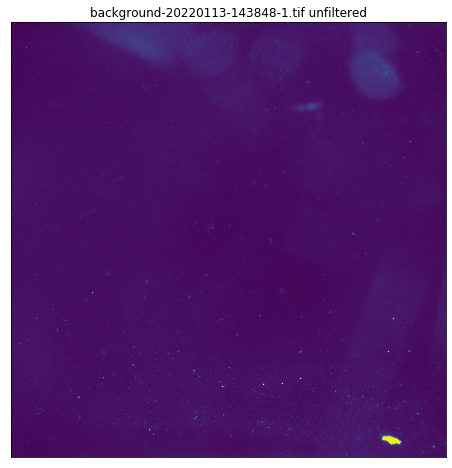

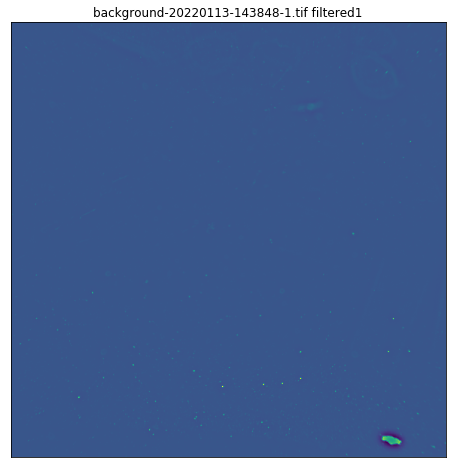

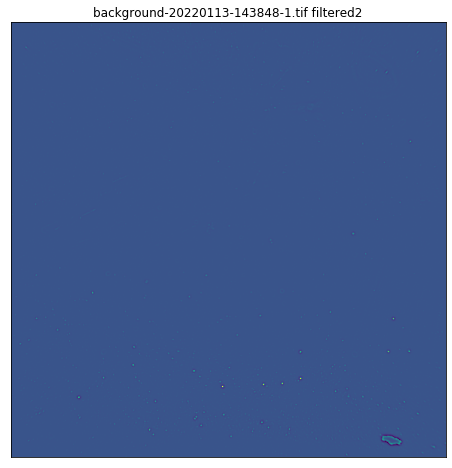

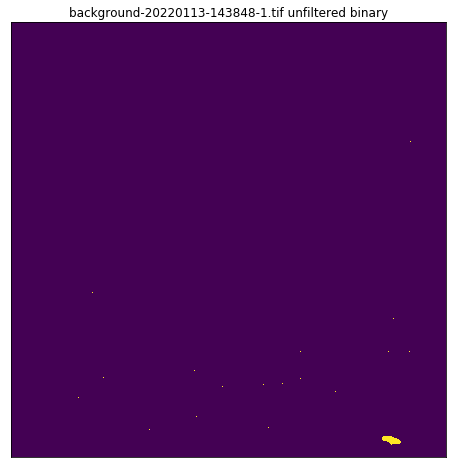

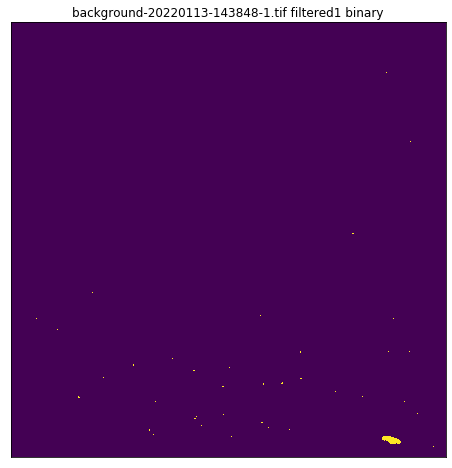

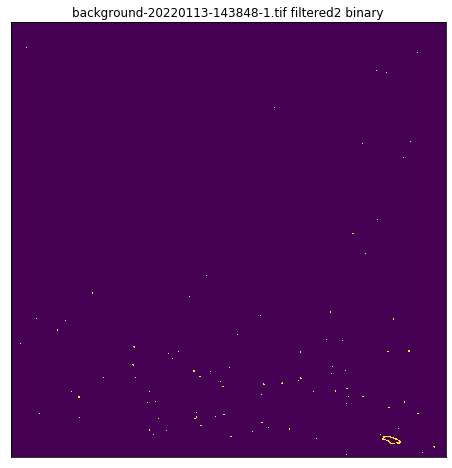

{'sum_unfiltered': 50112090624, 'sum_filtered1': -35.24406086647788, 'sum_filtered2': -1.2515368319631706, 'sum_bin_unfiltered': 1438, 'sum_bin_filtered1': 1713, 'sum_bin_filtered2': 2173}
------------------
background-20220113-143848-7.tif


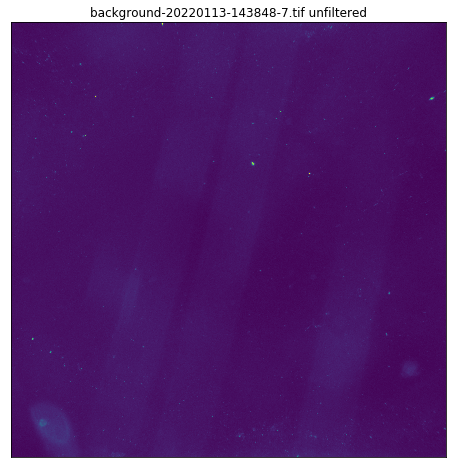

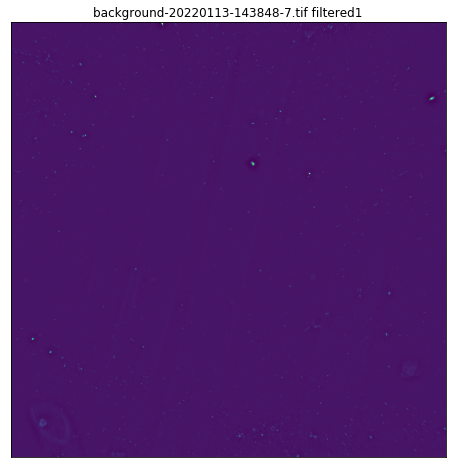

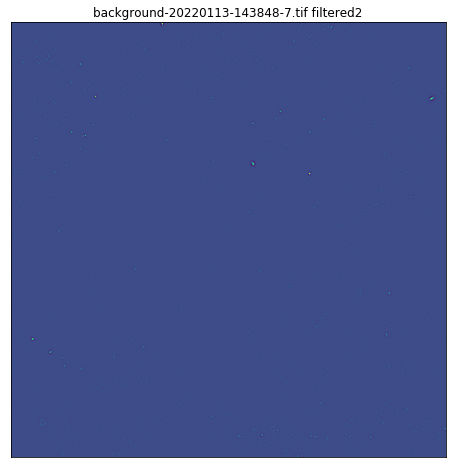

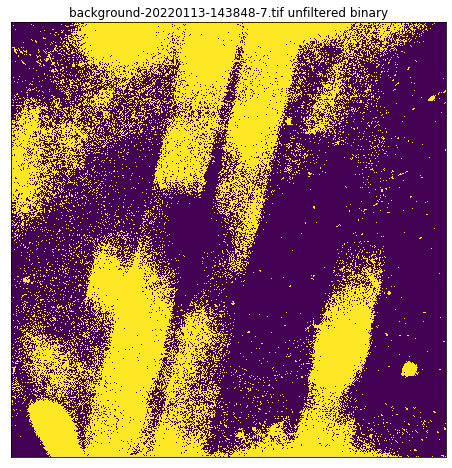

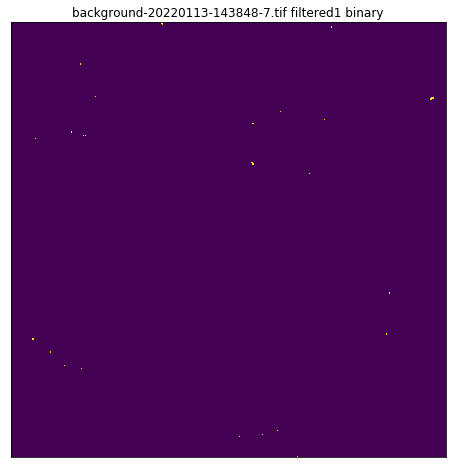

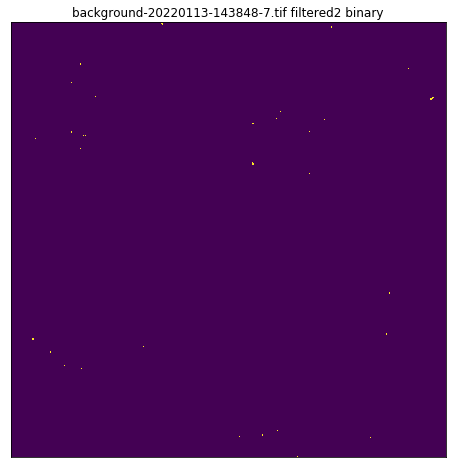

{'sum_unfiltered': 53396860800, 'sum_filtered1': -30.382746653935513, 'sum_filtered2': 0.2841468081177184, 'sum_bin_unfiltered': 780617, 'sum_bin_filtered1': 578, 'sum_bin_filtered2': 562}
------------------
background-20220203-200232-1.tif


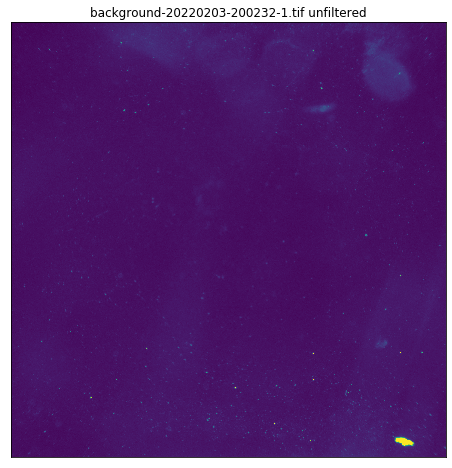

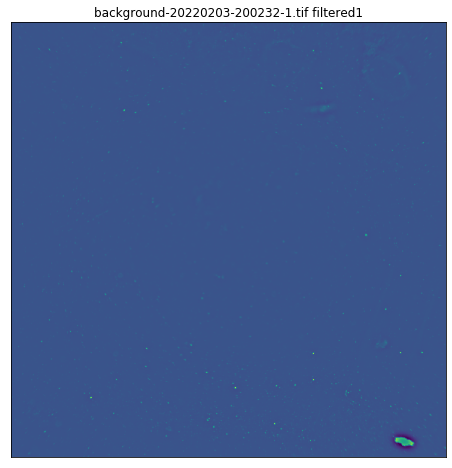

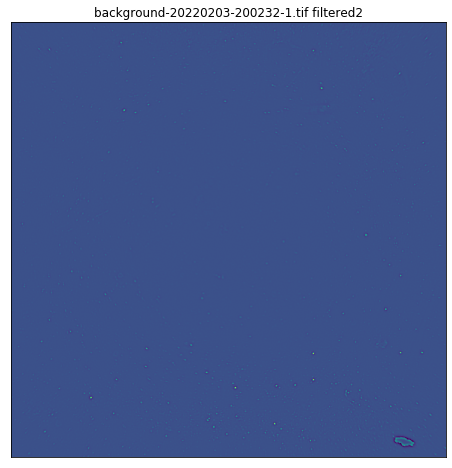

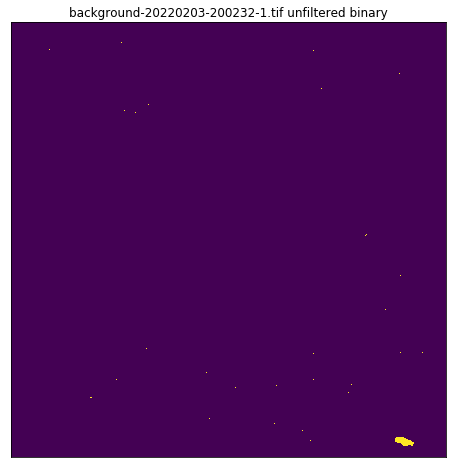

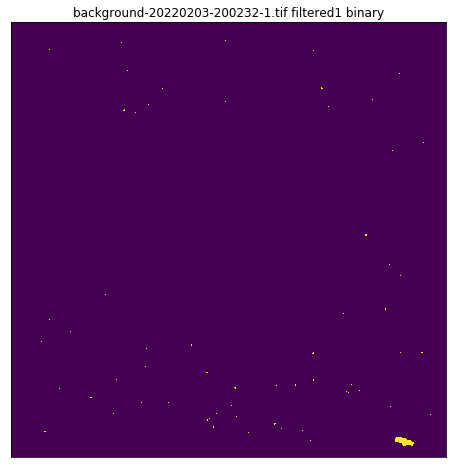

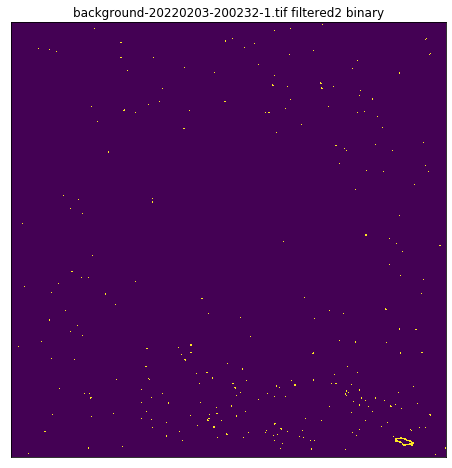

{'sum_unfiltered': 55747936640, 'sum_filtered1': -33.944866470091036, 'sum_filtered2': -1.5360444419719548, 'sum_bin_unfiltered': 1540, 'sum_bin_filtered1': 1966, 'sum_bin_filtered2': 4615}
------------------
background-20220203-200232-7.tif


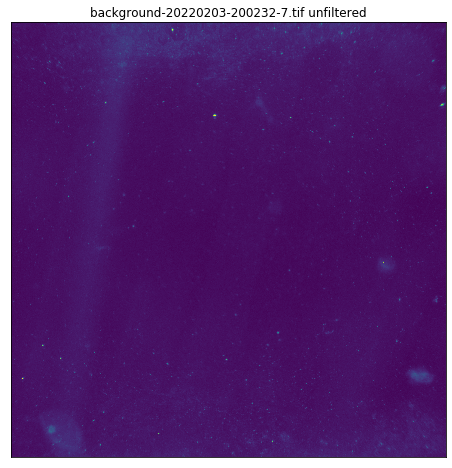

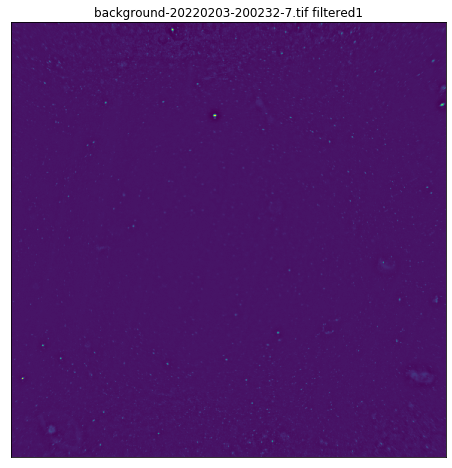

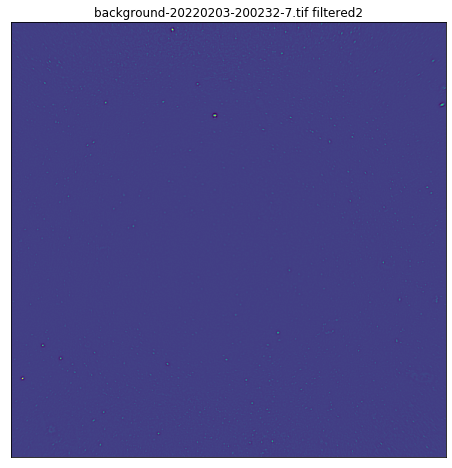

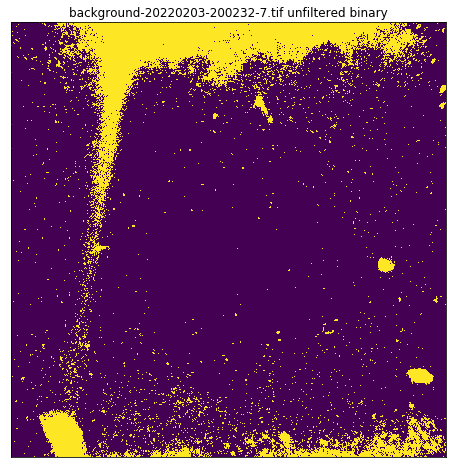

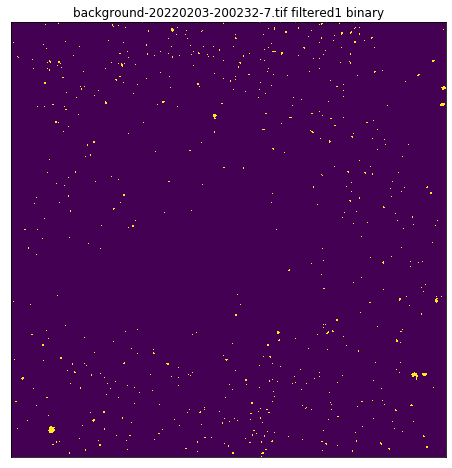

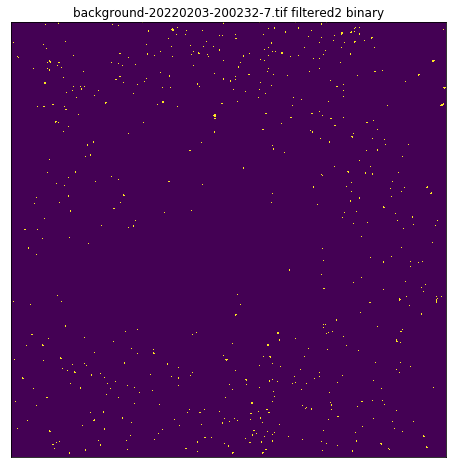

{'sum_unfiltered': 59850097408, 'sum_filtered1': -32.10548692161078, 'sum_filtered2': -1.2010917070399603, 'sum_bin_unfiltered': 287649, 'sum_bin_filtered1': 11137, 'sum_bin_filtered2': 8842}
------------------
background-20220204-135055-1.tif


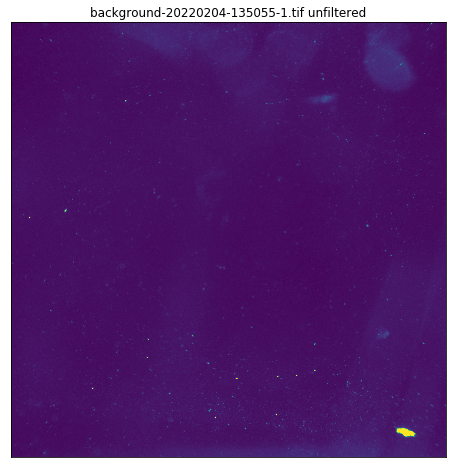

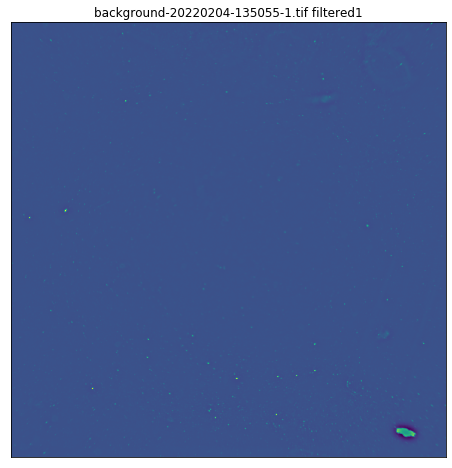

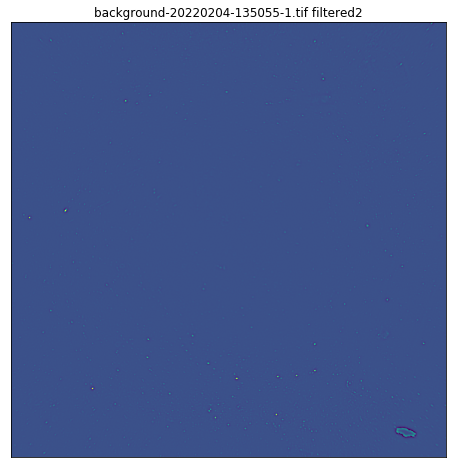

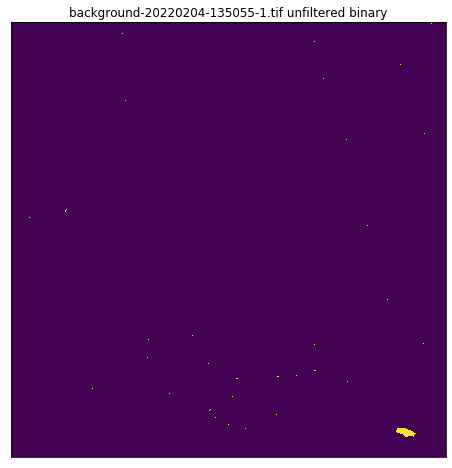

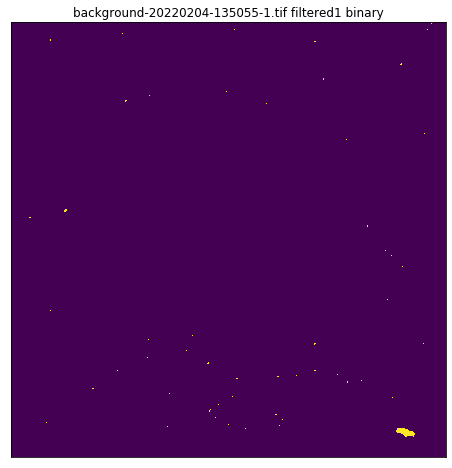

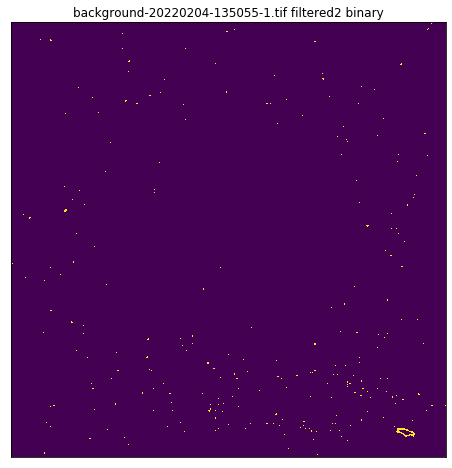

{'sum_unfiltered': 53083678976, 'sum_filtered1': -27.414808029336406, 'sum_filtered2': -0.2531448251546191, 'sum_bin_unfiltered': 1606, 'sum_bin_filtered1': 2061, 'sum_bin_filtered2': 4154}
------------------
background-20220204-135055-7.tif


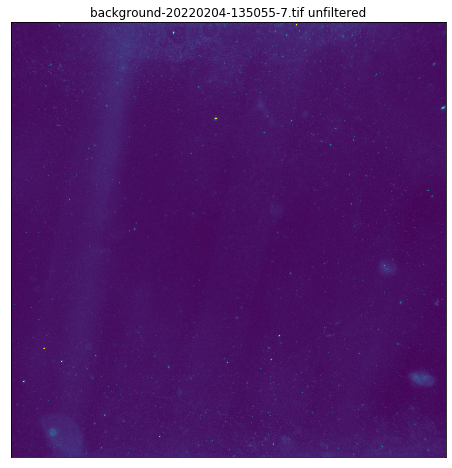

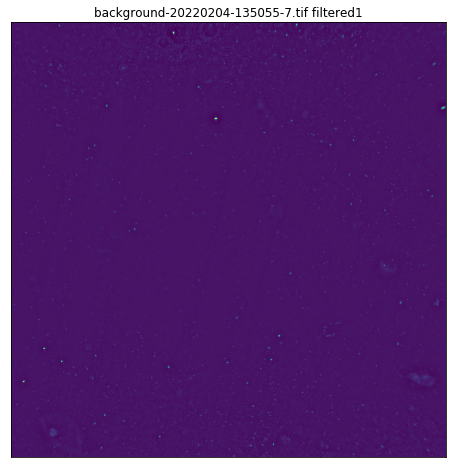

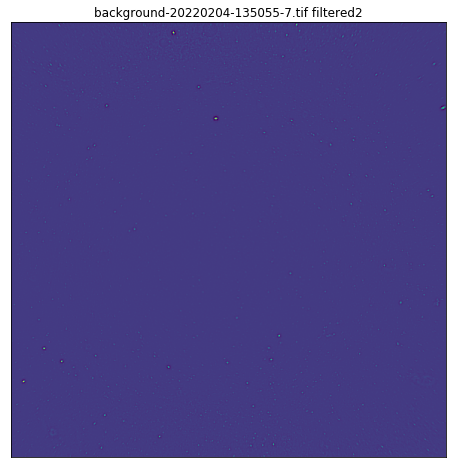

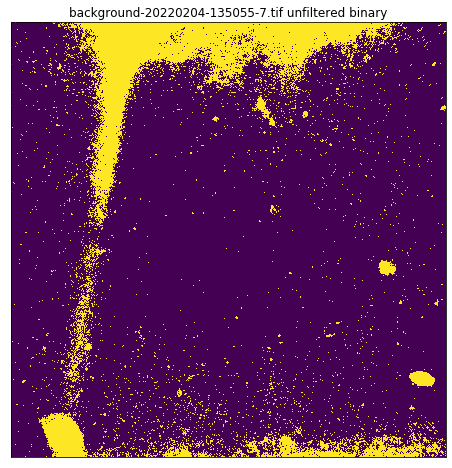

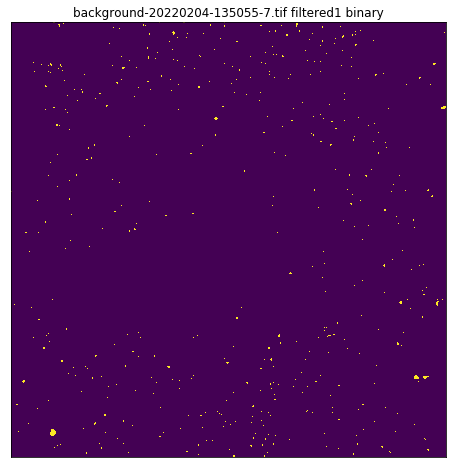

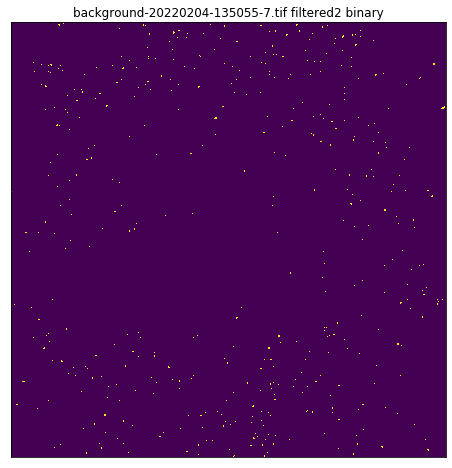

{'sum_unfiltered': 60449168000, 'sum_filtered1': -45.455278847055645, 'sum_filtered2': -1.1503504494048526, 'sum_bin_unfiltered': 281251, 'sum_bin_filtered1': 8548, 'sum_bin_filtered2': 6767}
------------------
background-20220222-145113-1.tif


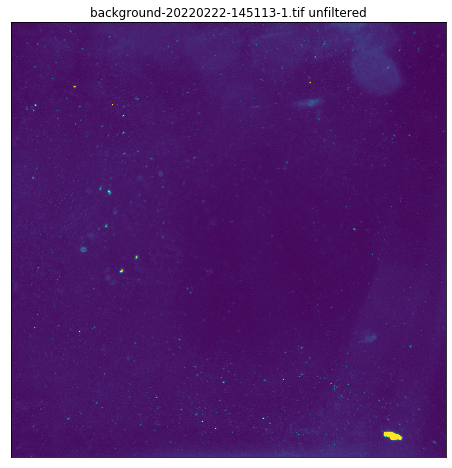

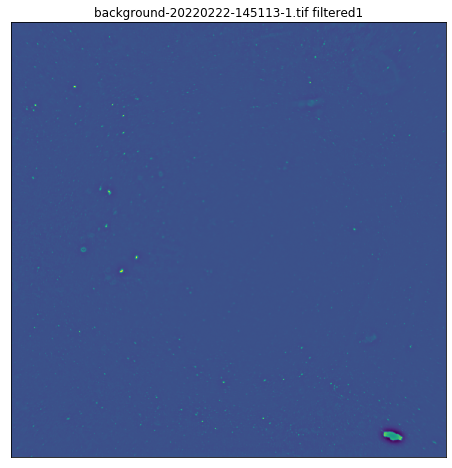

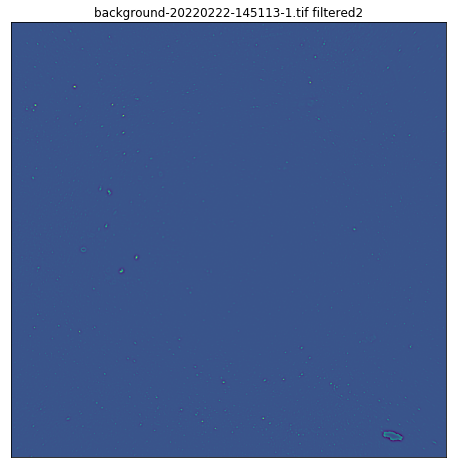

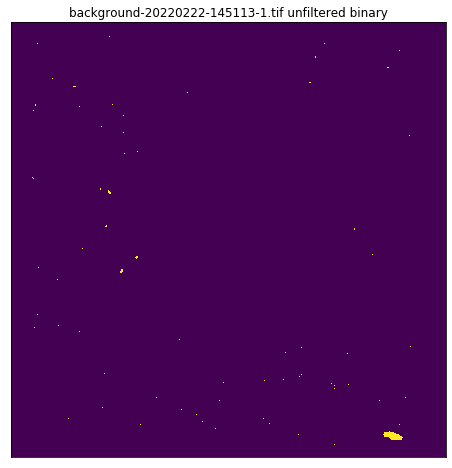

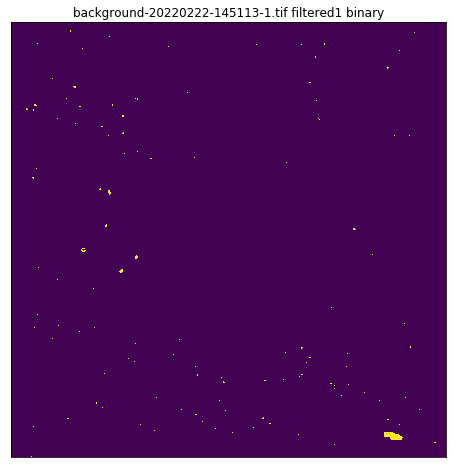

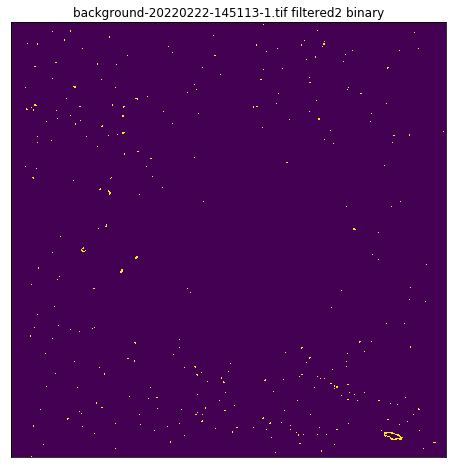

{'sum_unfiltered': 60380071680, 'sum_filtered1': -50.63795719188977, 'sum_filtered2': -0.8501778850866171, 'sum_bin_unfiltered': 2193, 'sum_bin_filtered1': 3423, 'sum_bin_filtered2': 5447}
------------------
background-20220222-145113-7.tif


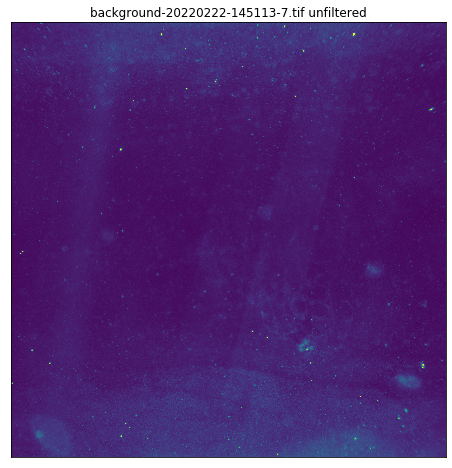

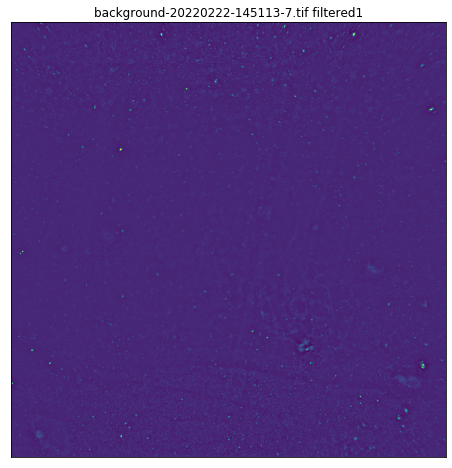

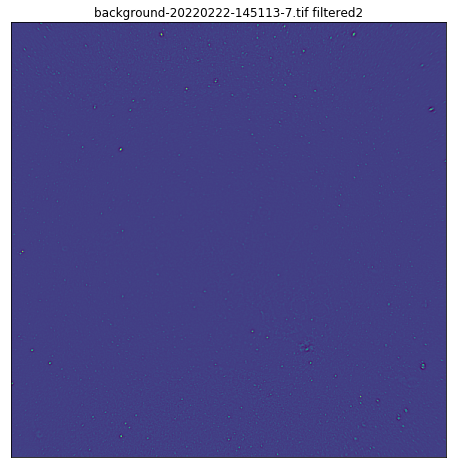

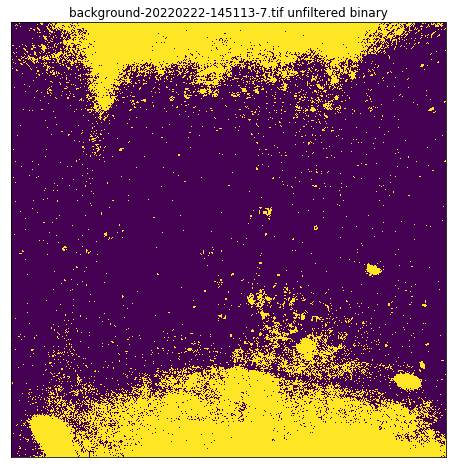

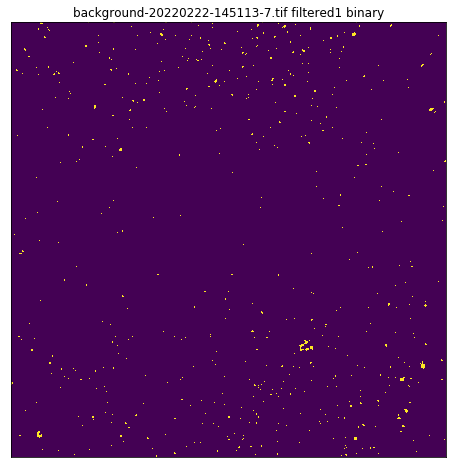

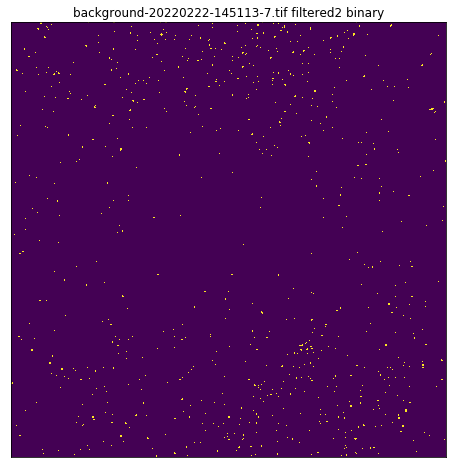

{'sum_unfiltered': 77115396608, 'sum_filtered1': -100.59892438013235, 'sum_filtered2': -2.4023735936135706, 'sum_bin_unfiltered': 521020, 'sum_bin_filtered1': 10857, 'sum_bin_filtered2': 11883}
------------------
background-20220302-193248-1.tif


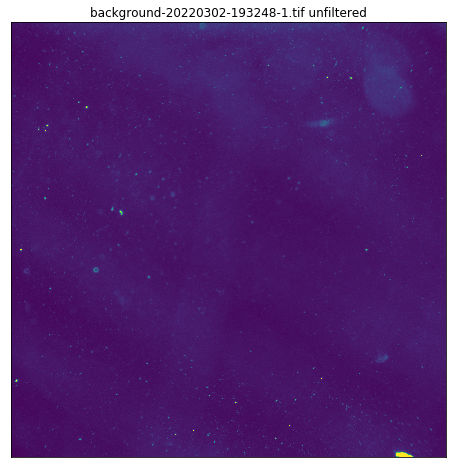

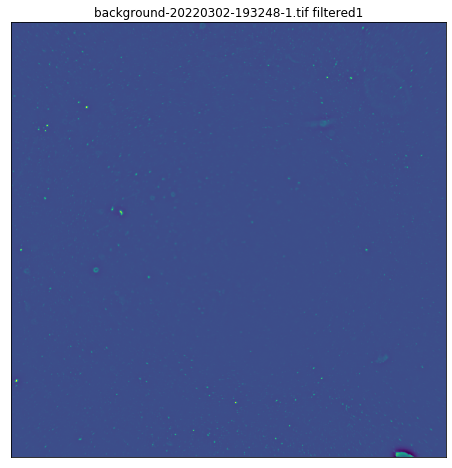

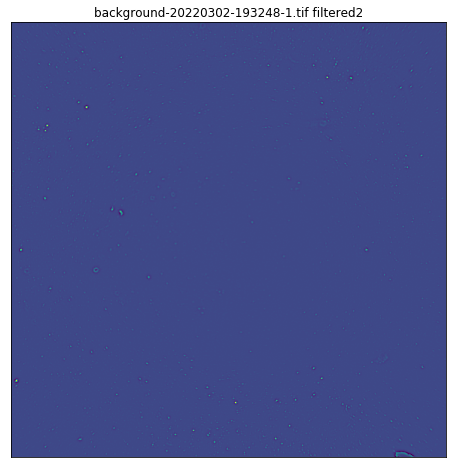

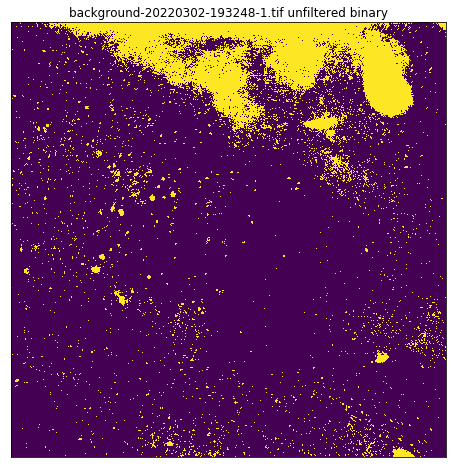

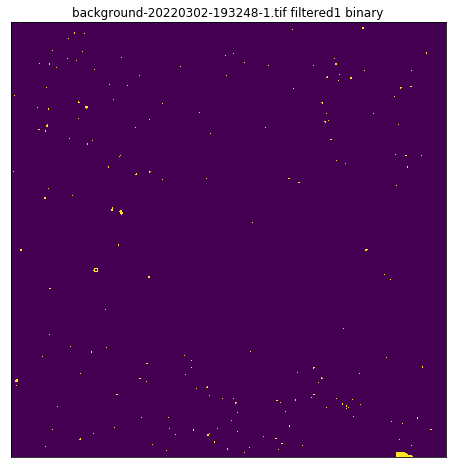

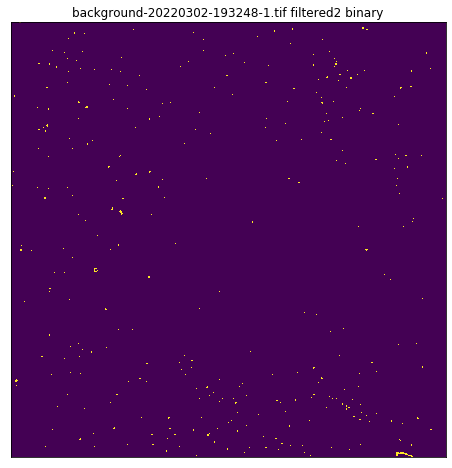

{'sum_unfiltered': 66502717568, 'sum_filtered1': -72.95993857519906, 'sum_filtered2': 0.8652433162079256, 'sum_bin_unfiltered': 267778, 'sum_bin_filtered1': 4099, 'sum_bin_filtered2': 5543}
------------------
background-20220302-193248-7.tif


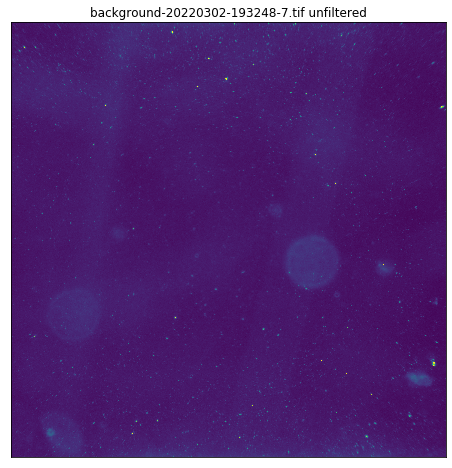

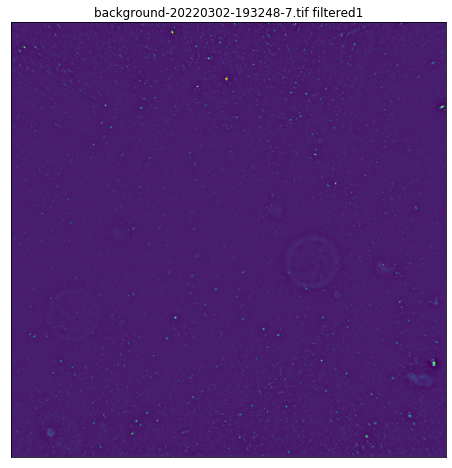

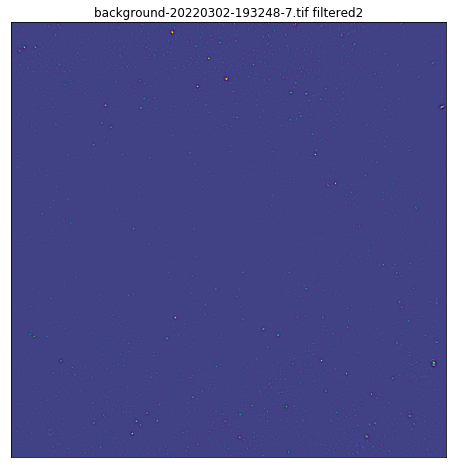

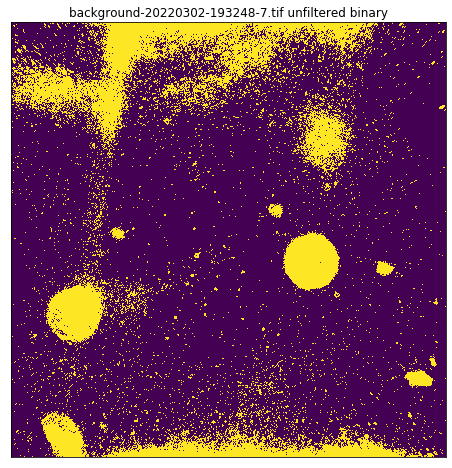

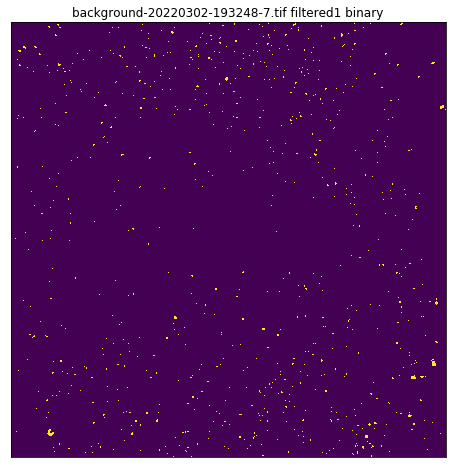

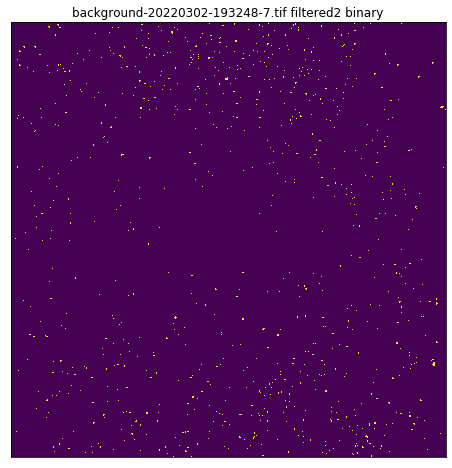

{'sum_unfiltered': 77735213824, 'sum_filtered1': -82.44657772544929, 'sum_filtered2': -2.201049988402139, 'sum_bin_unfiltered': 379675, 'sum_bin_filtered1': 13937, 'sum_bin_filtered2': 13273}
------------------
background-20220303-111846-1.tif


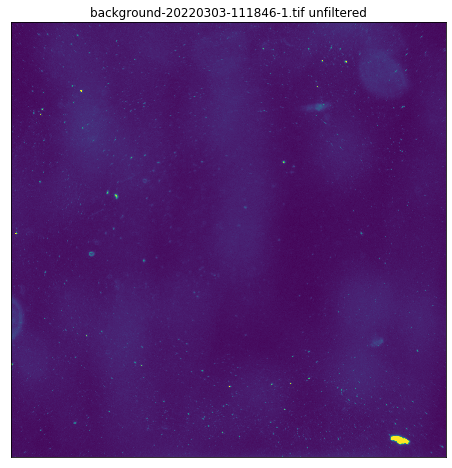

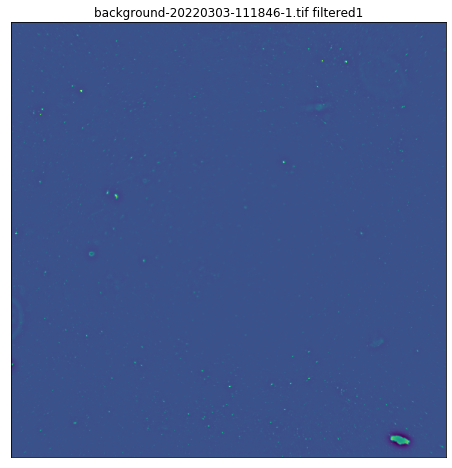

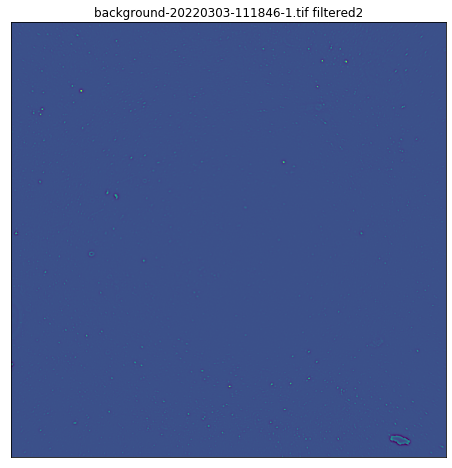

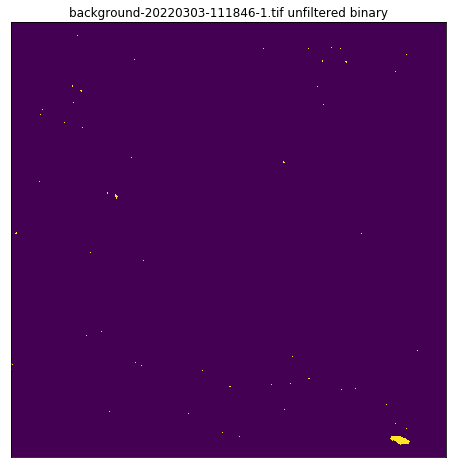

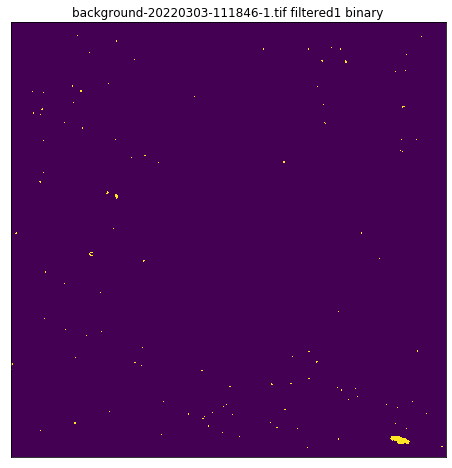

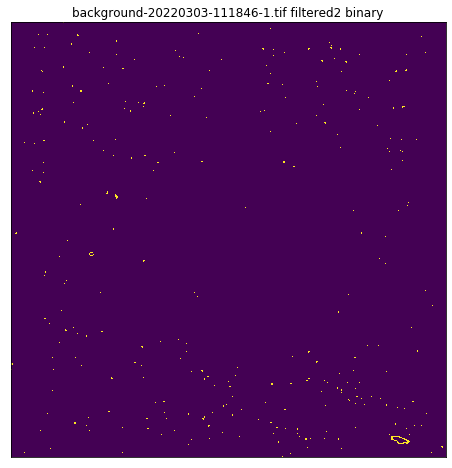

{'sum_unfiltered': 60626812160, 'sum_filtered1': -54.119241513639416, 'sum_filtered2': -1.263022198135351, 'sum_bin_unfiltered': 2050, 'sum_bin_filtered1': 3198, 'sum_bin_filtered2': 5467}
------------------
background-20220303-111846-7.tif


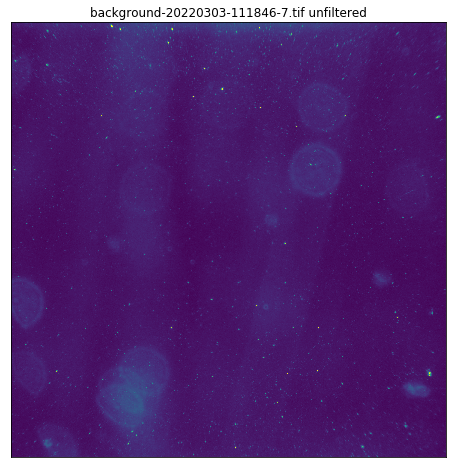

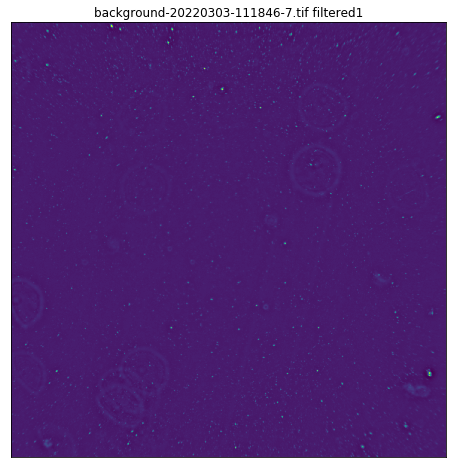

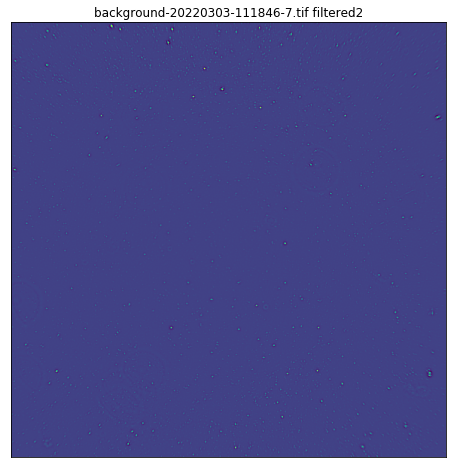

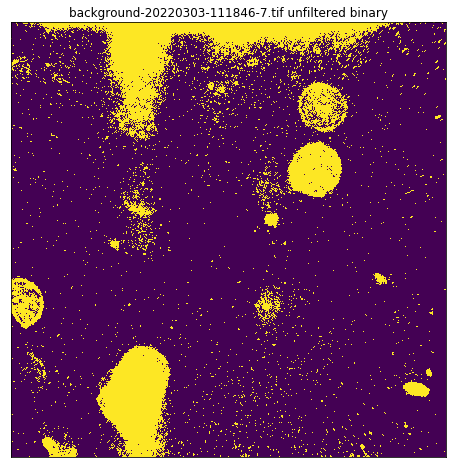

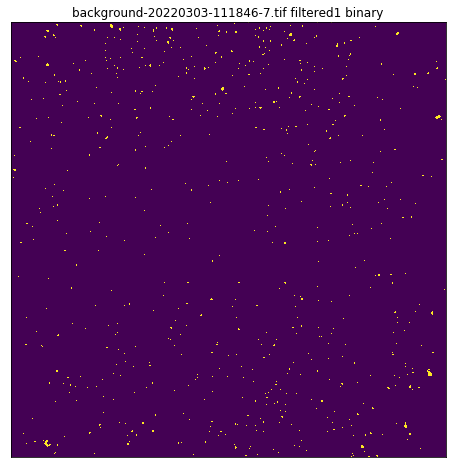

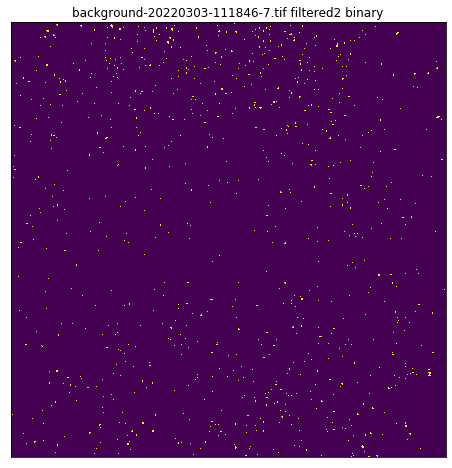

{'sum_unfiltered': 66276123776, 'sum_filtered1': -53.73434546708407, 'sum_filtered2': -1.3038083498687607, 'sum_bin_unfiltered': 304287, 'sum_bin_filtered1': 11707, 'sum_bin_filtered2': 13308}
------------------
background-20220307-114458-1.tif


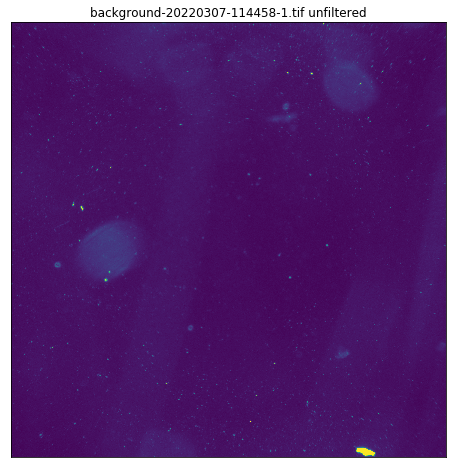

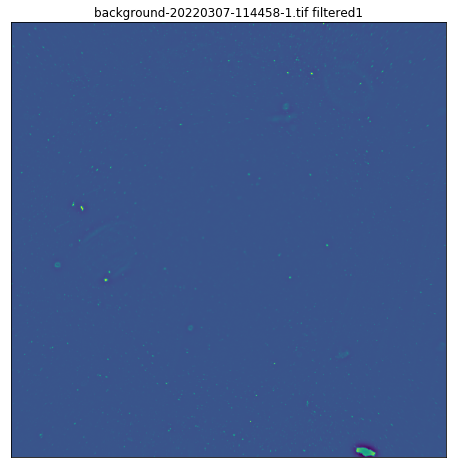

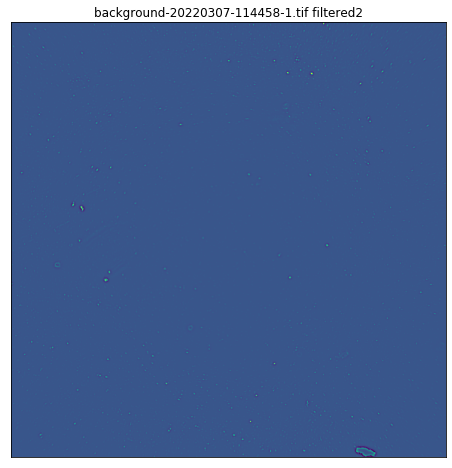

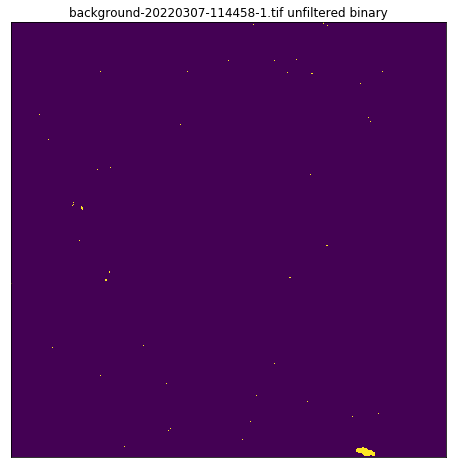

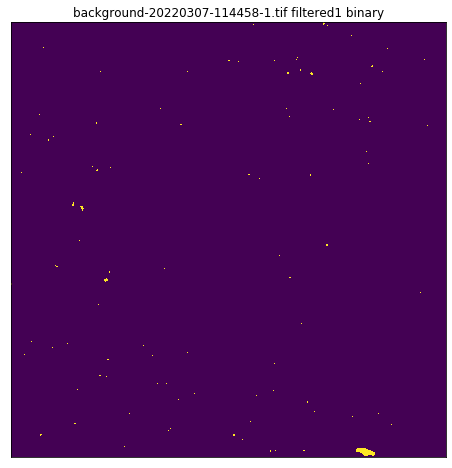

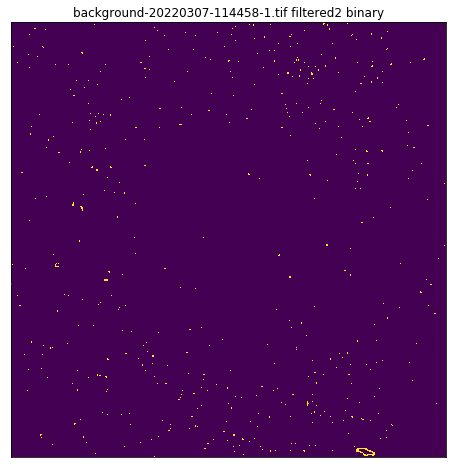

{'sum_unfiltered': 58126793984, 'sum_filtered1': 70.93807527975306, 'sum_filtered2': 3.490479932850718, 'sum_bin_unfiltered': 1905, 'sum_bin_filtered1': 2893, 'sum_bin_filtered2': 8142}
------------------
background-20220307-114458-7.tif


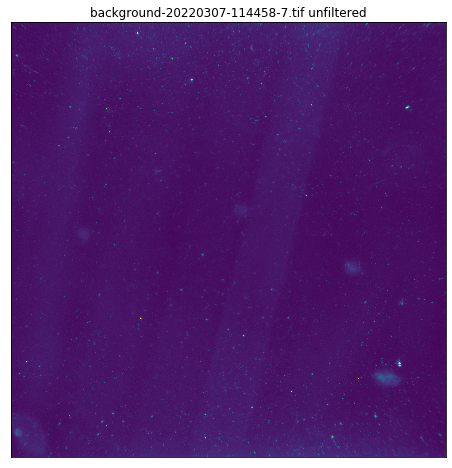

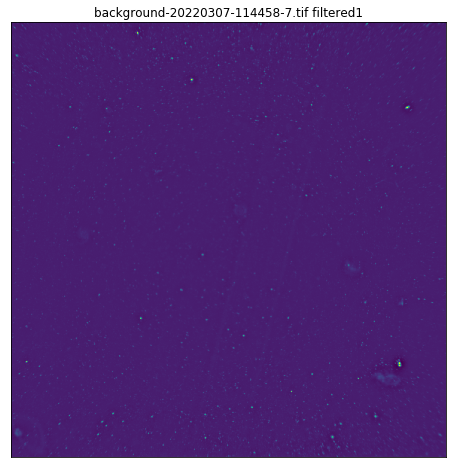

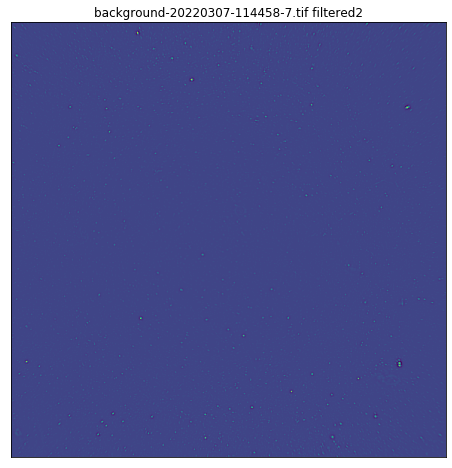

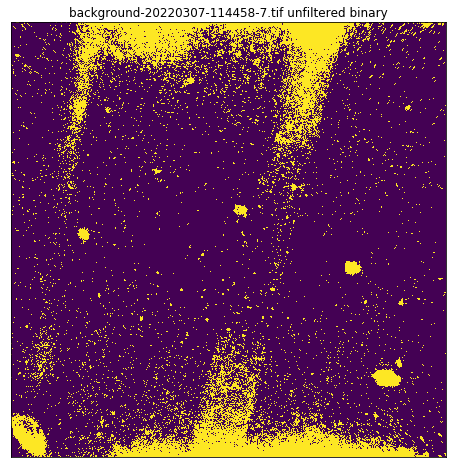

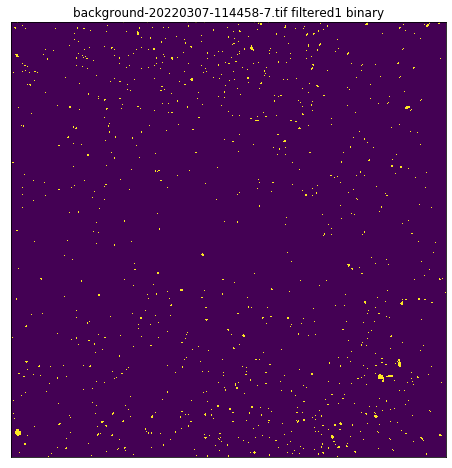

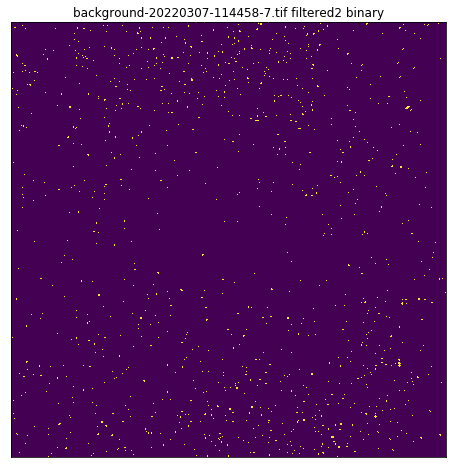

{'sum_unfiltered': 68889577088, 'sum_filtered1': -60.57191528859717, 'sum_filtered2': -1.5905847328576759, 'sum_bin_unfiltered': 308743, 'sum_bin_filtered1': 17508, 'sum_bin_filtered2': 16694}
------------------
background-20220308-123803-1.tif


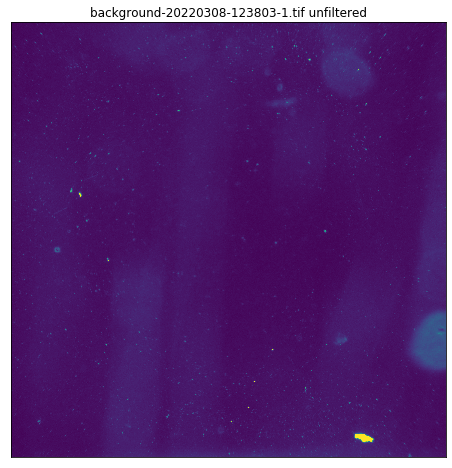

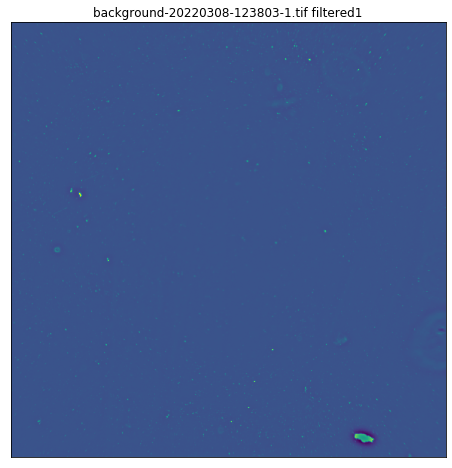

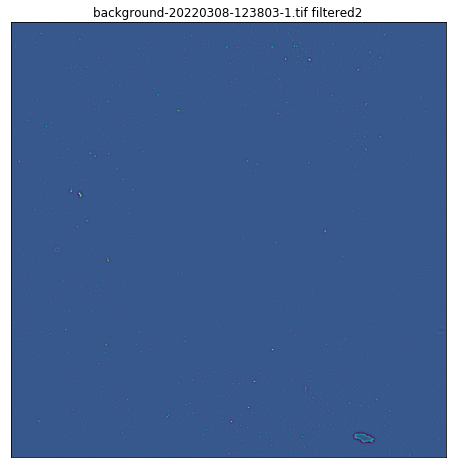

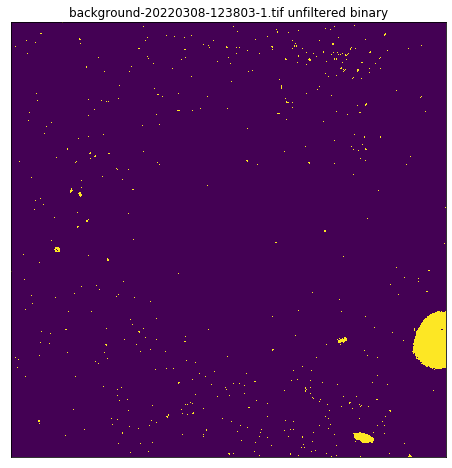

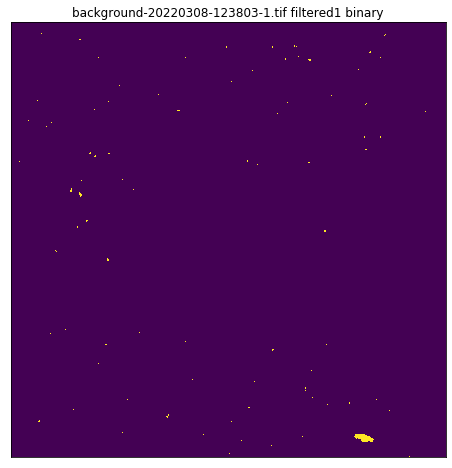

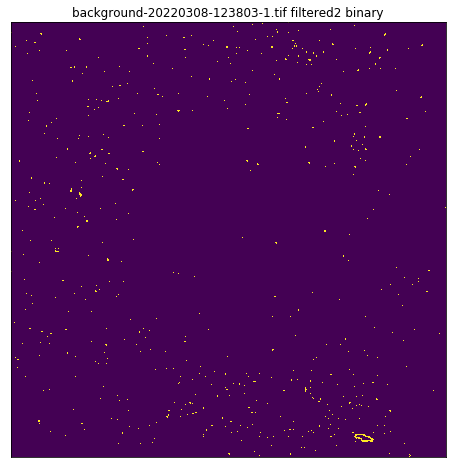

{'sum_unfiltered': 58237538560, 'sum_filtered1': -47.713815766198096, 'sum_filtered2': -0.9877645328231841, 'sum_bin_unfiltered': 25906, 'sum_bin_filtered1': 2663, 'sum_bin_filtered2': 8981}
------------------
background-20220308-123803-7.tif


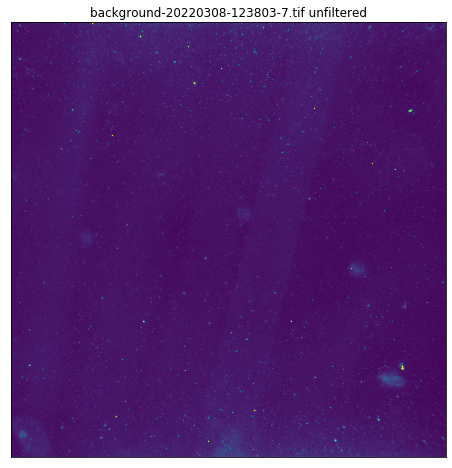

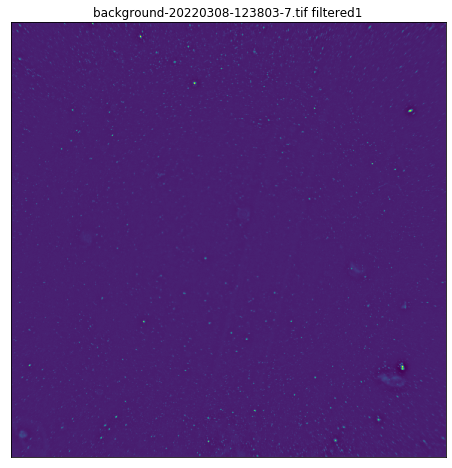

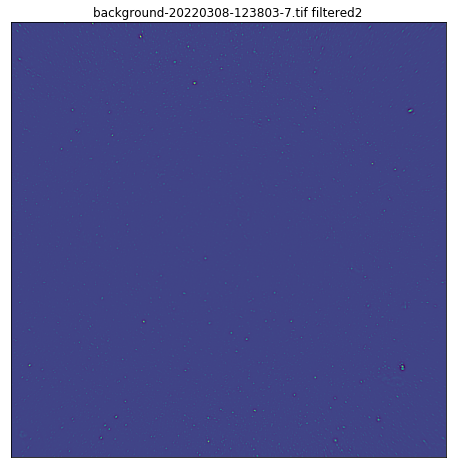

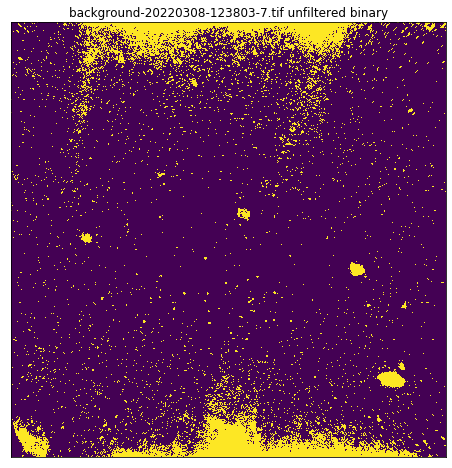

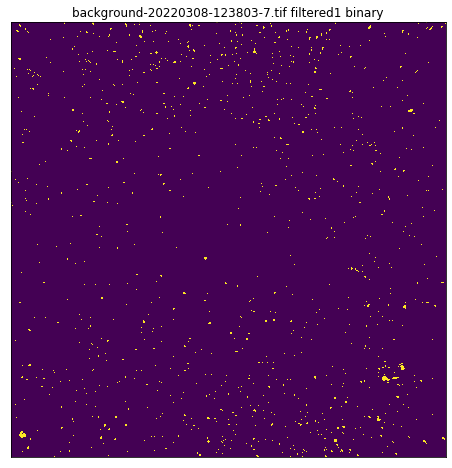

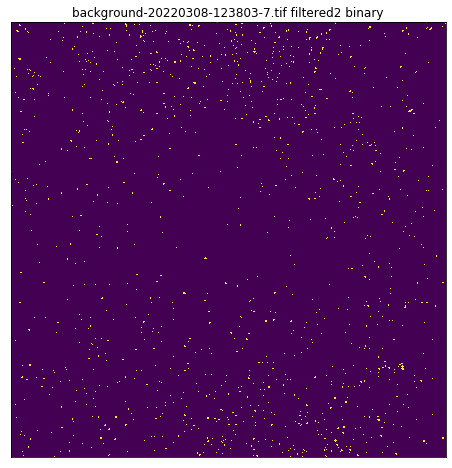

{'sum_unfiltered': 67754875136, 'sum_filtered1': -79.19236429370964, 'sum_filtered2': -1.4642195926556845, 'sum_bin_unfiltered': 216222, 'sum_bin_filtered1': 18556, 'sum_bin_filtered2': 17837}


In [37]:
df = pd.DataFrame(columns=['sum_unfiltered', 'sum_filtered1', 'sum_filtered2',
                           'sum_bin_unfiltered', 'sum_bin_filtered1', 'sum_bin_filtered2'])
image_names = sorted(os.listdir(data_dir))
for image_name in image_names:
    
    print('------------------')
    print(image_name)
    
    path = '%s/%s' % (data_dir, image_name)
    image = imread(path)

    # cropping and filtering
    
    image_cropped = crop_center(image,cropx,cropy)
    plt.figure(figsize=(8,8))
    plt.imshow(image_cropped)
    plt.title('%s unfiltered' % image_name)
    plt.xticks([])
    plt.yticks([])
    plt.show()

    filtered1_image = difference_of_gaussians(image_cropped, sig_min, sig_max1)
    plt.figure(figsize=(8,8))
    plt.imshow(filtered1_image)
    plt.title('%s filtered1' % image_name)
    plt.xticks([])
    plt.yticks([])
    plt.show()

    filtered2_image = difference_of_gaussians(filtered1_image, sigmin, sig_max2)
    plt.figure(figsize=(8,8))
    plt.imshow(filtered2_image)
    plt.title('%s filtered2' % image_name)
    plt.xticks([])
    plt.yticks([])
    plt.show()

    # get metrics

    binary = image_cropped > threshold_otsu(image_cropped)
    plt.figure(figsize=(8,8))
    plt.imshow(binary)
    plt.title('%s unfiltered binary' % image_name)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    filtered1_binary = filtered1_image > threshold_otsu(filtered1_image)
    plt.figure(figsize=(8,8))
    plt.imshow(filtered1_binary)
    plt.title('%s filtered1 binary' % image_name)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    filtered2_binary = filtered2_image > threshold_otsu(filtered2_image)
    plt.figure(figsize=(8,8))
    plt.imshow(filtered2_binary)
    plt.title('%s filtered2 binary' % image_name)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    sum_unfiltered = np.sum(image)
    sum_filtered1 = np.sum(filtered1_image)
    sum_filtered2 = np.sum(filtered2_image)
    
    sum_bin_unfiltered = np.sum(binary)
    sum_bin_filtered1 = np.sum(filtered1_binary)
    sum_bin_filtered2 = np.sum(filtered2_binary)
    
    # store results in a pandas table    
    row = {'sum_unfiltered': sum_unfiltered,
           'sum_filtered1': sum_filtered1,
           'sum_filtered2': sum_filtered2,
           'sum_bin_unfiltered': sum_bin_unfiltered, 
           'sum_bin_filtered1': sum_bin_filtered1,
           'sum_bin_filtered2': sum_bin_filtered2}
    
    print(row)
    
    df = df.append(row, ignore_index=True)
    
df['image_name'] = image_names
cols = ['image_name', 'sum_unfiltered', 'sum_filtered1', 'sum_filtered2',
        'sum_bin_unfiltered', 'sum_bin_filtered1', 'sum_bin_filtered2']
df = df[cols]

In [38]:
df

,image_name,sum_unfiltered,sum_filtered1,sum_filtered2,sum_bin_unfiltered,sum_bin_filtered1,sum_bin_filtered2
0,background-20220107-111707-1.tif,5.043562e+10,-11.312241,-0.361044,1241.0,1206.0,1196.0
1,background-20220107-111707-7.tif,5.026444e+10,6.130394,0.281362,765298.0,527.0,279.0
2,background-20220112-105942-1.tif,5.386801e+10,12.817985,-1.478305,98500.0,1148.0,1107.0
3,background-20220112-105942-7.tif,5.536590e+10,-1.821988,-0.355021,48415.0,698.0,235.0
4,background-20220112-132037-1.tif,5.439952e+10,-0.978675,-1.317151,1391.0,1569.0,2448.0
5,background-20220112-132037-7.tif,5.853306e+10,78.824881,-2.444836,80862.0,4172.0,2409.0
6,background-20220113-143848-1.tif,5.011209e+10,-35.244061,-1.251537,1438.0,1713.0,2173.0
7,background-20220113-143848-7.tif,5.339686e+10,-30.382747,0.284147,780617.0,578.0,562.0
8,background-20220203-200232-1.tif,5.574794e+10,-33.944866,-1.536044,1540.0,1966.0,4615.0
9,background-20220203-200232-7.tif,5.985010e+10,-32.105487,-1.201092,287649.0,11137.0,8842.0


# Results

Plot for each metric with the image name on the vertical axis ticks.

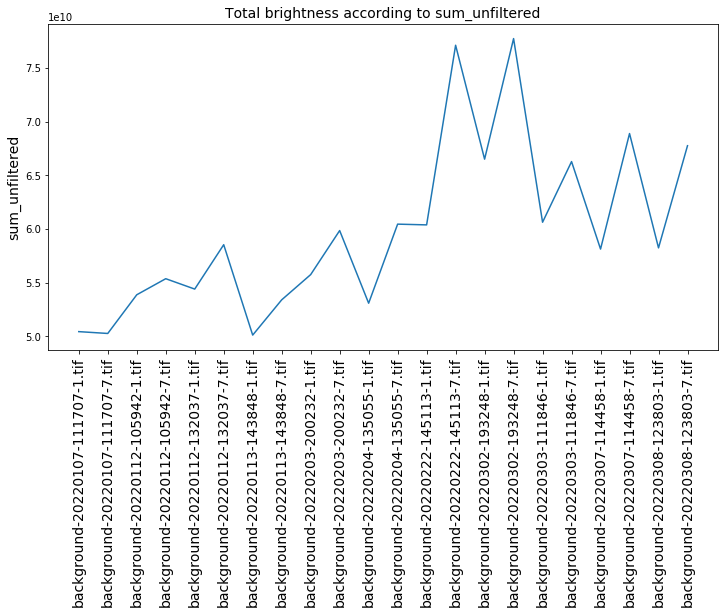

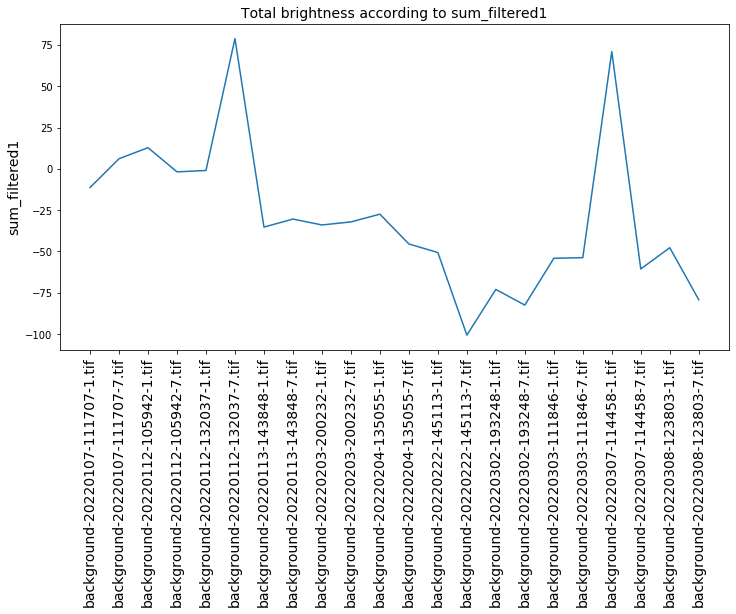

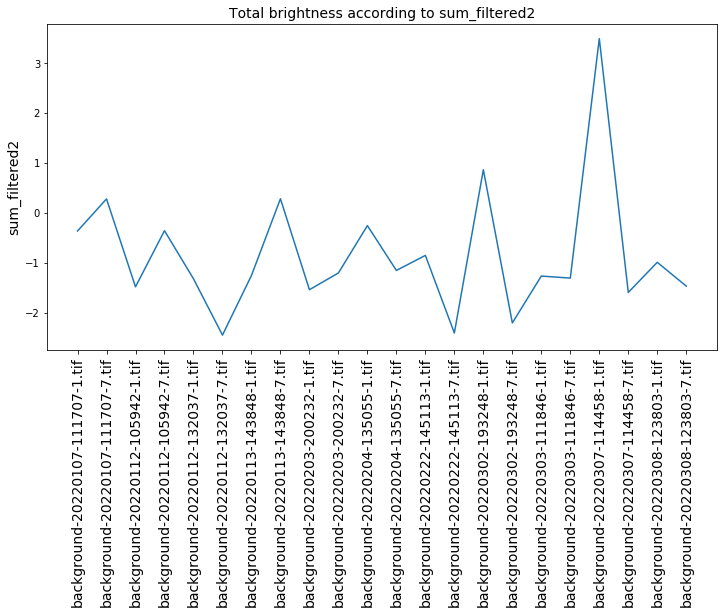

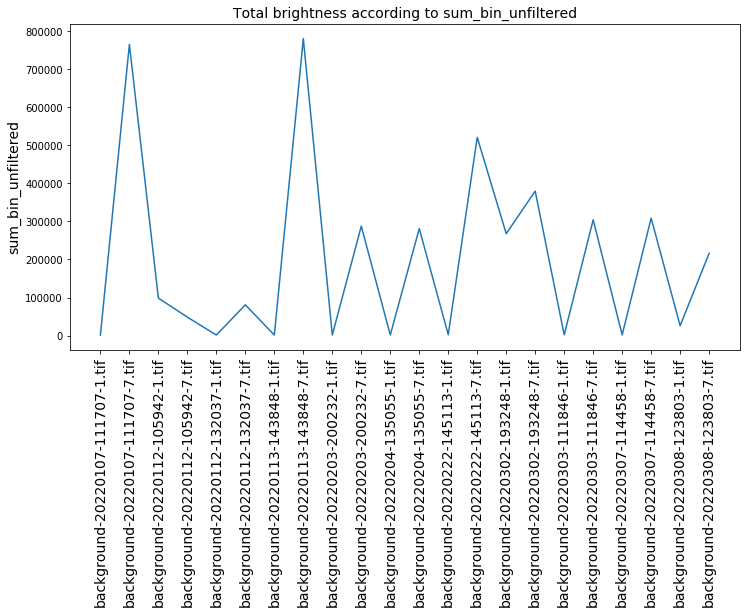

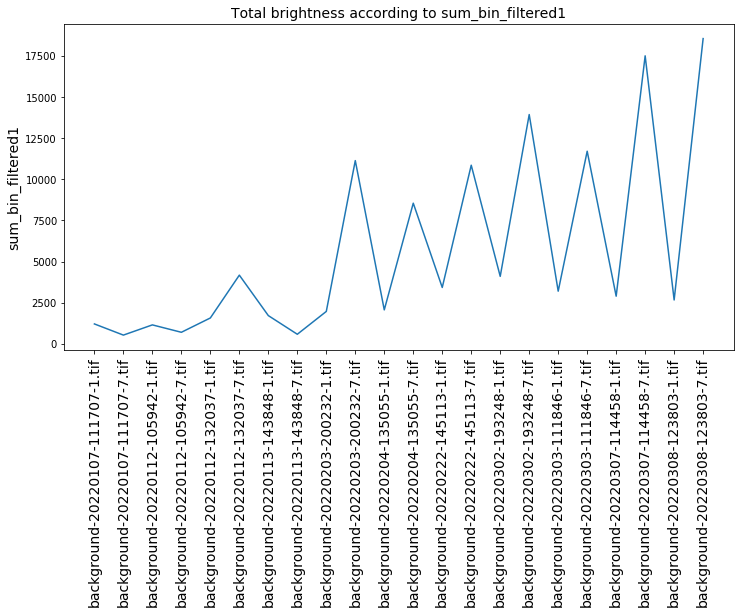

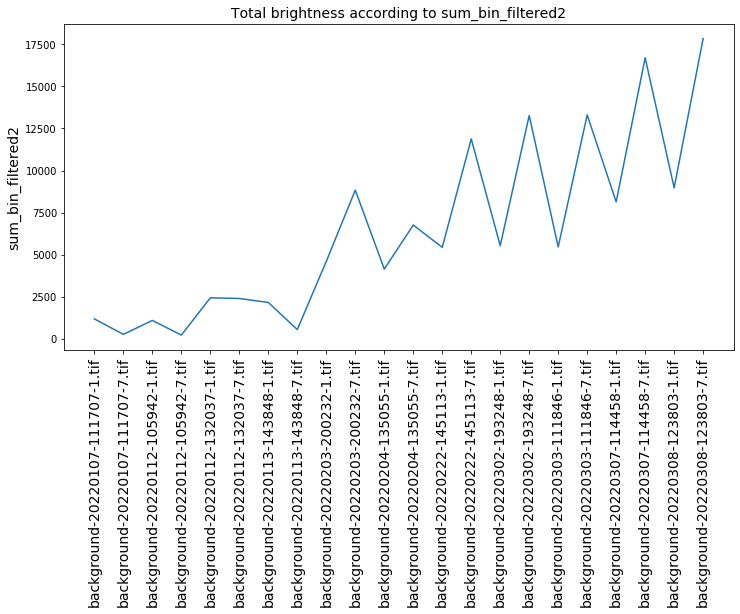

In [55]:
fs = 14
for metric in cols[1:]:
    plt.figure(figsize=(12,6))
    plt.plot(df['image_name'], df[metric])
    plt.xticks(rotation=90, fontsize=fs)
    plt.ylabel(metric, fontsize=fs)
    plt.title('Total brightness according to %s' % metric, fontsize=fs)
    plt.show()